In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim import corpora, models
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import gensim
nltk.download('vader_lexicon')
from textblob import TextBlob
from gensim.models import CoherenceModel
from gensim.models import TfidfModel
import re
import spacy
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import seaborn as sns
from collections import Counter
import random
import ssl
import string


# Set SSL environment variable pointing to Certifi certificates
ssl._create_default_https_context = ssl._create_unverified_context

# Now download NLTK data
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Error loading vader_lexicon: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:992)>
[nltk_data] Downloading package punkt to /Users/victoria/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/victoria/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# 600e Opinion Leaders: Articles & Youtube Video Transcripts

In [55]:
opinionLeaders600_original = pd.read_csv('600e - Opinion Leaders.csv')
opinionLeaders600 = opinionLeaders600_original.copy()
opinionLeaders600.head()

,ID,Text,Date,Title,Channel Name
0,https://news.google.com/articles/CBMiHmh0dHBzO...,JAKARTA - Fiat recently revealed their latest ...,2023-12-29,NaN,NaN
1,https://news.google.com/articles/CBMiJ2h0dHBzO...,"Customers asked for more crossovers, and Fiat ...",2023-08-21,NaN,NaN
2,https://news.google.com/articles/CBMiJ2h0dHBzO...,\nRelatively affordable to buy. Very useable 2...,2023-09-27,NaN,NaN
3,https://news.google.com/articles/CBMiKWh0dHBzO...,4.0 out of 5 The ‘Frappuccino' of the small el...,2023-09-22,NaN,NaN
4,https://news.google.com/articles/CBMiNGh0dHBzO...,There are two specifications available on the ...,2024-03-05,NaN,NaN


In [56]:
# Check length of the dataframe
len(opinionLeaders600)

99

In [57]:
# Check if columns exist before dropping them
columns_to_drop = ['Date', 'Title', 'Channel Name']
if all(col in opinionLeaders600.columns for col in columns_to_drop):
    opinionLeaders600 = opinionLeaders600.drop(columns=columns_to_drop)

## Clustering Analysis 

#### Finding Optimal Number of Clusters

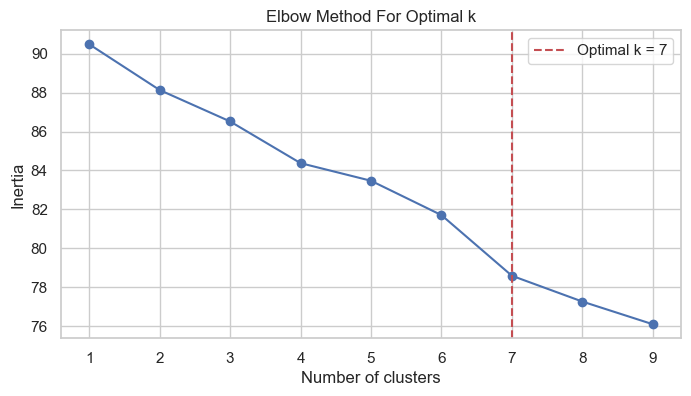

The optimal number of clusters based on the Elbow Method is: 7


In [58]:
# Custom stopwords list
custom_stopwords = set(stopwords.words('english')).union({
     'electric','ev','model', 'car', 'cars', 'fiat', 'peugeot', 'jeep', 'hyundai', 'kona', 'mini','stellantis', 'sherpa','honda','zoe', 'renault', 'tesla','chinese','avenger', 'abarth',
    'market', 'available', 'new', 'offered', 'sold', 'week', 'level', 'move','presented',
    'would', 'also', 'like', 'even', 'according', 'one', 'since', 'still', 'two', 
    'content', 'information', 'interests', 'activity', 'mean', 'go', 'quit',
    'got', 'much', 'actual', 'thing', 'bit', 'see', 'think', 'yeah', 'know', 'and', 
    'way', 'come',  'example', 'esposito', 'lee', 'torque', 'ready', 'around', 'use', 'um', 
    'together', 'us', 'really', 'america', 'well', 'mirafiori', 'campaign', 'north',
    'bag', 'says', 'get', 'world', 'germani', 'belgium', 'spain',
    'uh', 'oh', 'im', 'thats', 'youre', 'weve', 'dont', 'actually', 'work', 'reuters','youve','there','going',
    'gelateria', 'list', 'required', 'instead', 'added', 'inbox',  'help', 'dedicated',
    'inform', 'news', 'group', 'report', 'couldnt', 'three', 'including', 'however', 'people',
    'ice', 'doesnt', 'less',  'kind', 'want', 'fat', 'okay', 'notice','be', 'comes', 'little', 'feeling', 
    'claim', 'ever', 'probably', 'take', 'something', 'end', 'many', 'ago', 'ive',
    'thought', 'claimed', 'data', 'review', 'isnt', 'regarding', 'listed', 'enable', 'saved', 'necessary',
    'said', 'may', 'point', 'armani', 'entity', 'giorgio', 'uk', 'lot', 'let', 'quite', 'need', 'e',
    'murray', 'gordon', 'could', 'turn', 'day', 'thinking', 'long', 'able', 
    'generation', 'consent', 'phev', 'bo', 'official', 'steve', 'delivers', 'f', 'browse', 'seventh', 'fourth','fowler',
    'auction', 'right', 'say', 'course', 'yes', 'spot', 'minute', 'time', 'form', 'choice', 'string', 'order'
})

# Convert stopwords to list
custom_stopwords = list(custom_stopwords)

# Function to preprocess the text
def preprocess(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Tokenize
    tokens = word_tokenize(text)
    # Remove stopwords
    tokens = [word for word in tokens if word not in custom_stopwords and word.isalpha()]
    return ' '.join(tokens)

# Apply preprocessing to the text column
opinionLeaders600['Processed_Text'] = opinionLeaders600['Text'].apply(preprocess)

# Create a TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words=custom_stopwords)
X_tfidf = tfidf_vectorizer.fit_transform(opinionLeaders600['Processed_Text'])

# Apply the Elbow Method to determine the optimal number of clusters
inertia = []
K_range = range(1, 10)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_tfidf)
    inertia.append(kmeans.inertia_)

# Find the "elbow" point
def find_elbow(inertia, K_range):
    slopes = np.diff(inertia)
    optimal_k = np.argmax(np.diff(slopes)) + 2
    return optimal_k

optimal_k_elbow = find_elbow(inertia, K_range)

# Plotting the inertia to find the elbow
plt.figure(figsize=(8, 4))
plt.plot(K_range, inertia, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.axvline(x=optimal_k_elbow, color='r', linestyle='--', label=f'Optimal k = {optimal_k_elbow}')
plt.legend()
plt.show()

print(f"The optimal number of clusters based on the Elbow Method is: {optimal_k_elbow}")

#### Apply K-means Clustering

In [59]:
num_clusters = 7
kmeans_model = KMeans(n_clusters=optimal_k_elbow, random_state=42)
clusters = kmeans_model.fit_predict(X_tfidf)

# Add the cluster labels to the original DataFrame
opinionLeaders600['Cluster'] = clusters

# Display the DataFrame with the new cluster column
print(opinionLeaders600.head())


                                                  ID  \
0  https://news.google.com/articles/CBMiHmh0dHBzO...   
1  https://news.google.com/articles/CBMiJ2h0dHBzO...   
2  https://news.google.com/articles/CBMiJ2h0dHBzO...   
3  https://news.google.com/articles/CBMiKWh0dHBzO...   
4  https://news.google.com/articles/CBMiNGh0dHBzO...   

                                                Text  \
0  JAKARTA - Fiat recently revealed their latest ...   
1  Customers asked for more crossovers, and Fiat ...   
2  \nRelatively affordable to buy. Very useable 2...   
3  4.0 out of 5 The ‘Frappuccino' of the small el...   
4  There are two specifications available on the ...   

                                      Processed_Text  Cluster  
0  jakarta recently revealed latest suv name elec...        6  
1  customers asked crossovers answer request bett...        3  
2  relatively affordable buy useable range topspe...        3  
3  frappuccino small suv space manages fashionabl...        3  
4  spe

#### PCA Analysis

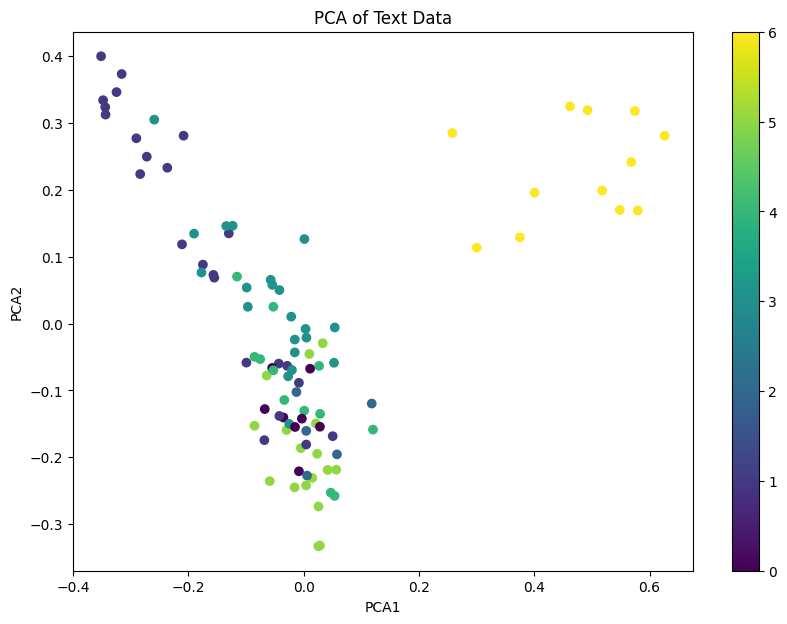

In [7]:
# Apply PCA to reduce the dimensions of the TF-IDF matrix
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_tfidf.toarray())

# Add PCA results to the original DataFrame
opinionLeaders600['PCA1'] = pca_result[:, 0]
opinionLeaders600['PCA2'] = pca_result[:, 1]

# Plot the PCA results
plt.figure(figsize=(10, 7))
plt.scatter(opinionLeaders600['PCA1'], opinionLeaders600['PCA2'], c=opinionLeaders600['Cluster'], cmap='viridis', marker='o')
plt.colorbar()
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('PCA of Text Data')
plt.show()


**Distinct Clusters**
* The plot shows distinct clusters, particularly the group of points on the right side (Cluster 6). This suggests that there are distinct themes or topics among the opinion leaders that are notably different from others
* The points that are closer together on the left side (more towards the center) indicate more similarity in content, meaning these comments or articles likely share more common themes or language.

**Overlapping Clusters**
* Clusters 0, 1, 2, and 3 overlap significantly, suggesting that while there are some differences, they share more common characteristics with each other.
* This overlap might indicate that the topics discussed in these clusters are more general or less distinctive.

#### Sentiment Analysis

In [60]:
# Initialise the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Apply sentiment analysis to each processed text
opinionLeaders600['Sentiment'] = opinionLeaders600['Processed_Text'].apply(lambda x: sia.polarity_scores(x)['compound'])


<Figure size 640x480 with 0 Axes>

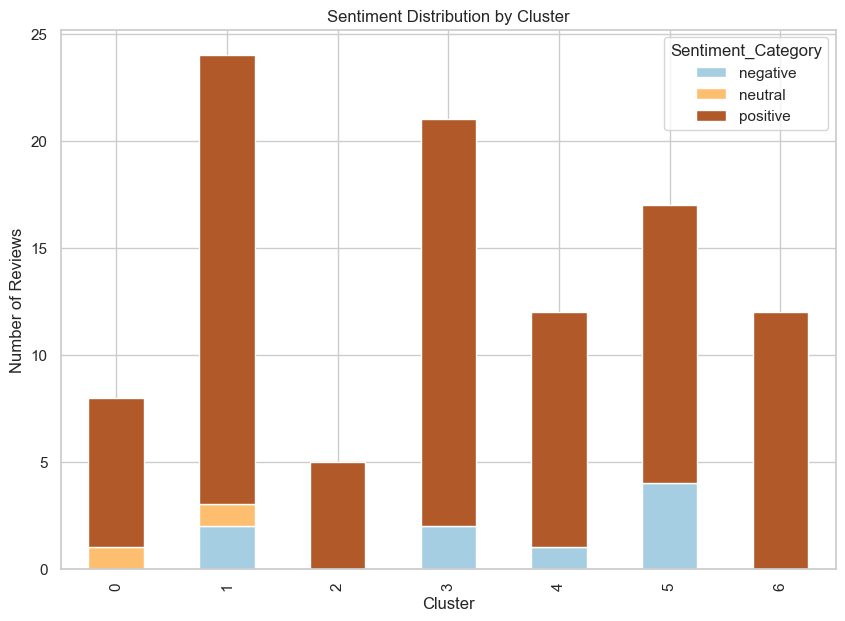

In [63]:
# Calculate average sentiment score for each cluster
average_sentiment_by_cluster = opinionLeaders600.groupby('Cluster')['Sentiment'].mean()

# Categorise sentiment
def categorize_sentiment(score):
    if score > 0.05:
        return 'positive'
    elif score < -0.05:
        return 'negative'
    else:
        return 'neutral'

opinionLeaders600['Sentiment_Category'] = opinionLeaders600['Sentiment'].apply(categorize_sentiment)

# Calculate sentiment distribution for each cluster
sentiment_distribution_by_cluster = opinionLeaders600.groupby(['Cluster', 'Sentiment_Category']).size().unstack().fillna(0)

# Plot sentiment distribution for each cluster
# Remove spines
sns.set_theme()
sns.set_style('whitegrid')
sns.despine()
sentiment_distribution_by_cluster.plot(kind='bar', stacked=True, figsize=(10, 7), colormap='Paired')
plt.xlabel('Cluster')
plt.ylabel('Number of Reviews')
plt.title('Sentiment Distribution by Cluster')
plt.show()

#### Detailed Cluster Analysis

In [62]:
# Function to get top keywords for each cluster
def get_top_keywords(tfidf_matrix, clusters, feature_names, top_n=10):
    df = pd.DataFrame(tfidf_matrix.todense()).groupby(clusters).mean()
    return df.apply(lambda x: [feature_names[i] for i in x.argsort()[-top_n:]], axis=1)

# Get the feature names from the TF-IDF vectorizer
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get top keywords for each cluster
top_keywords_by_cluster = get_top_keywords(X_tfidf, clusters, feature_names)

# Extract sample articles and common themes
for cluster_num in range(num_clusters):
    print(f"Cluster {cluster_num}:")
    cluster_data = opinionLeaders600[opinionLeaders600['Cluster'] == cluster_num]
    sample_articles = cluster_data.sample(3)  # Get 3 sample articles for each cluster
    common_words = top_keywords_by_cluster[cluster_num]
    
    print("Sample Articles:")
    for _, row in sample_articles.iterrows():
        print(f" - {row['Text']}")
    
    print(f"Common Words: {common_words}")
    print(f"Average Sentiment: {average_sentiment_by_cluster[cluster_num]}")
    print(f"Sentiment Distribution: \n{sentiment_distribution_by_cluster.loc[cluster_num]}")
    print("\n")


Cluster 0:
Sample Articles:
 - Buy a Cable Shield Electric Vehicle Charging Cable Protector on Amazon.
 - Fiat has announced it is phasing out the option of being able to order your car in a dull grey hue in its bid to re-establish itself as the “Brand of Colours”. Announcing it has stopped producing grey cars with immediate effect, the decision to drop the option of grey paint is said to coincide with the launch of the all-new 2024 Fiat 600e on July 4. From now on, Fiat says it wants to offer its customers a palette that is inspired by the Italian sea, sun, earth and sky. Currently, the Fiat 500e, 500 Hybrid, 500X and the European-only Panda and Tipo are offered in Gelato white, Sicilia orange, Paprika orange, Passione red, Blu Dipinto di blu, Italia blue, Venezia blue, Rugiada green, Foresta green, Rose gold and Cinema black. The move to drop grey could prove controversial as in markets like the UK where it remains hugely popular, accounting for one in every four cars sold across all

**Cluster 0**
* Sample Articles:
Articles generally discuss improvements and features of the Fiat 600e.
Focus on performance, pricing, and technical details.
* Common Words: ['gives', 'details', 'already', 'buy', 'volvo', 'range', 'longer', 'cable', 'priced', 'grey']
* Average Sentiment: Positive (0.476)
* Sentiment Distribution: Predominantly positive.
* Customers in this cluster appreciate detailed information about the car's features and performance.
* Positive sentiment indicates satisfaction with the improvements and features discussed.

**Cluster 1**
* Sample Articles:
Extensive reviews and personal opinions on the design and functionality of the Fiat 600e.
Comparisons with other cars and personal preferences.
* Common Words: ['small', 'feel', 'per', 'back', 'nice', 'music', 'driving', 'drive', 'miles', 'good']
* Average Sentiment: Highly positive (0.758)
* Sentiment Distribution: Predominantly positive.
* This cluster contains in-depth reviews and personal experiences, which are generally positive.
* The focus is on the car's design, driving experience, and personal satisfaction.

**Cluster 2**
* Sample Articles:
Discussions on pricing, market performance, and sales figures.
Comparison with competitors.
* Common Words: ['crossover', 'inches', 'incentives', 'sales', 'year', 'version', 'germany', 'france', 'italy', 'europe']
* Average Sentiment: Positive (0.738)
* Sentiment Distribution: All positive.
* This cluster focuses on market analysis and sales performance.
* Positive sentiment suggests a favorable view of the Fiat 600e's market position despite competition.

**Cluster 3**
* Sample Articles:
Detailed technical specifications and design features of the Fiat 600e.
Comparison with previous models and other brands.
* Common Words: ['red', 'driving', 'suv', 'prima', 'driver', 'italian', 'la', 'front', 'charger', 'rear']
* Average Sentiment: Positive (0.700)
* Sentiment Distribution: Predominantly positive.
* Customers in this cluster are interested in technical details and design features.
* Positive sentiment indicates satisfaction with the car's specifications and design.

**Cluster 4**
* Sample Articles:
General information about the Fiat 600e, including design, features, and market positioning.
* Common Words: ['vehicle', 'addition', 'looking', 'offers', 'automakers', 'italian', 'prices', 'prima', 'la', 'red']
* Average Sentiment: Positive (0.664)
* Sentiment Distribution: Predominantly positive.
* This cluster provides general overviews and positive sentiment about the Fiat 600e.
* Indicates overall satisfaction with the car's offerings and market position.

**Cluster 5**
* Sample Articles:
News articles and reviews discussing the Fiat 600e in the context of market trends and competitor analysis.
* Common Words: ['took', 'olivier', 'offtopic', 'ceo', 'mildhybrid', 'panda', 'tipo', 'revealed', 'francois', 'video']
* Average Sentiment: Moderately positive (0.503)
* Sentiment Distribution: Mixed but skewed towards positive.
* Mixed reviews with a focus on market context and competitor analysis.
* Moderately positive sentiment suggests a cautious optimism about the Fiat 600e.

**Cluster 6**
* Sample Articles:
Detailed technical descriptions and features of the Fiat 600e.
Discussions on design and market strategy.
* Common Words: ['make', 'made', 'digital', 'service', 'respect', 'purposes', 'characters', 'signals', 'choices', 'entities']
* Average Sentiment: Positive (0.708)
* Sentiment Distribution: All positive.
* High focus on technical and design aspects with very positive sentiment.
* Indicates strong satisfaction with the car's technical features and design.

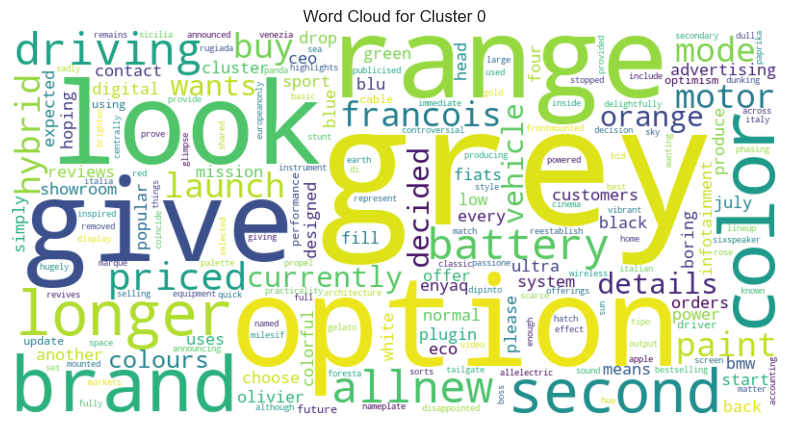

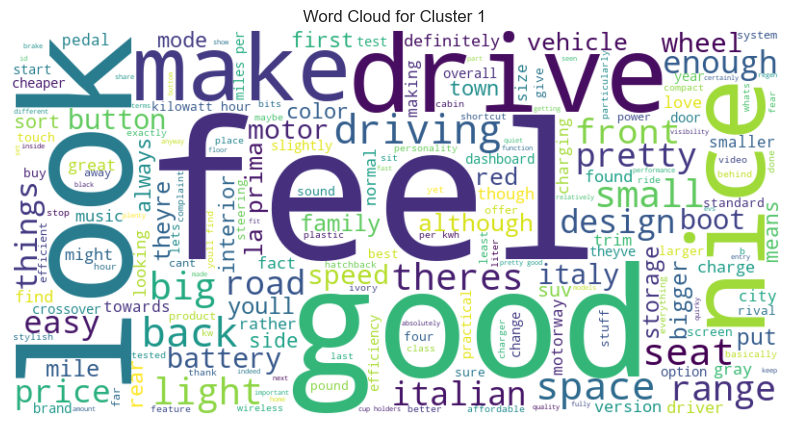

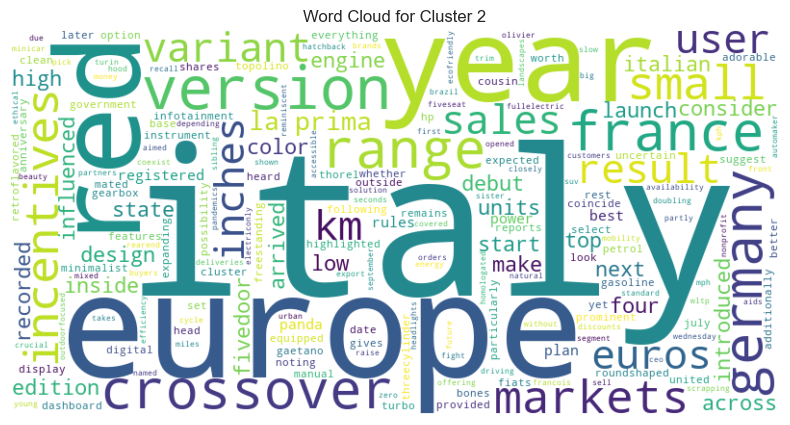

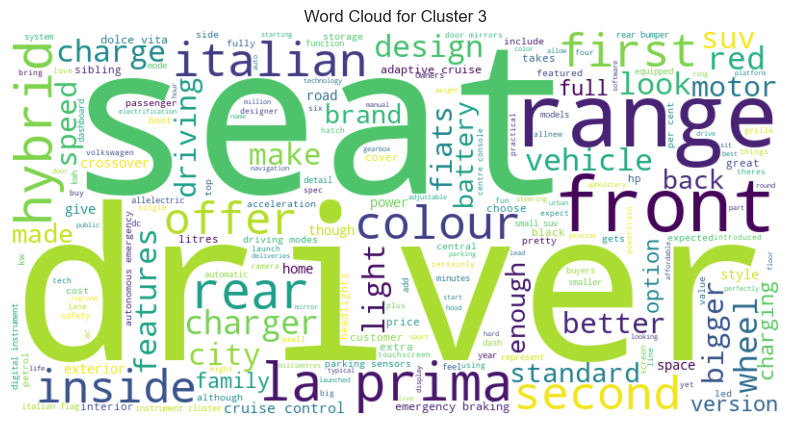

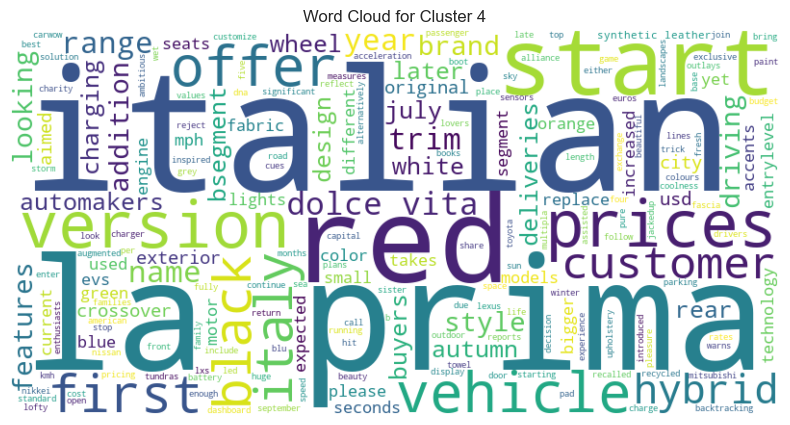

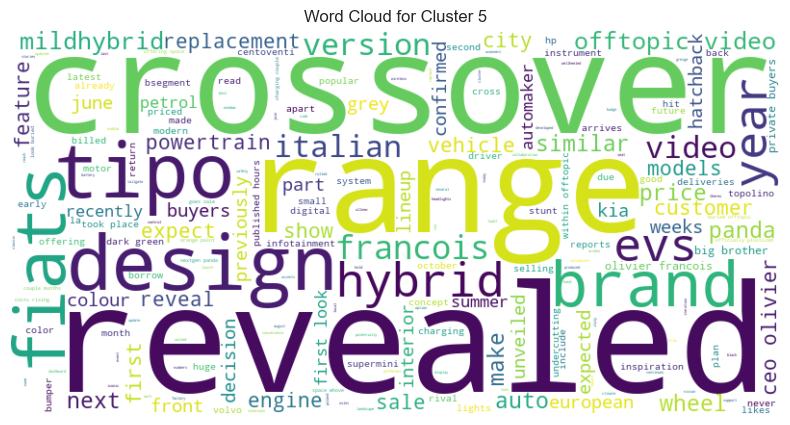

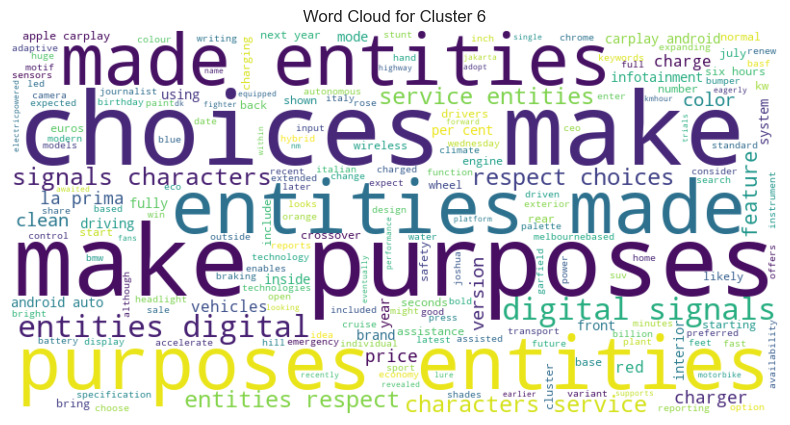

In [19]:
# Create a function to generate a word cloud
def generate_word_cloud(text, cluster_number):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster_number}')
    plt.axis('off')
    plt.show()

# Concatenate the text data for each cluster
cluster_texts = {}
for cluster_number in sorted(opinionLeaders600['Cluster'].unique()):  # Sorting cluster numbers
    cluster_text = ' '.join(opinionLeaders600[opinionLeaders600['Cluster'] == cluster_number]['Processed_Text'])
    cluster_texts[cluster_number] = cluster_text

# Generate word clouds for each cluster
for cluster_number in sorted(cluster_texts.keys()):  # Sorting cluster numbers
    generate_word_cloud(cluster_texts[cluster_number], cluster_number)


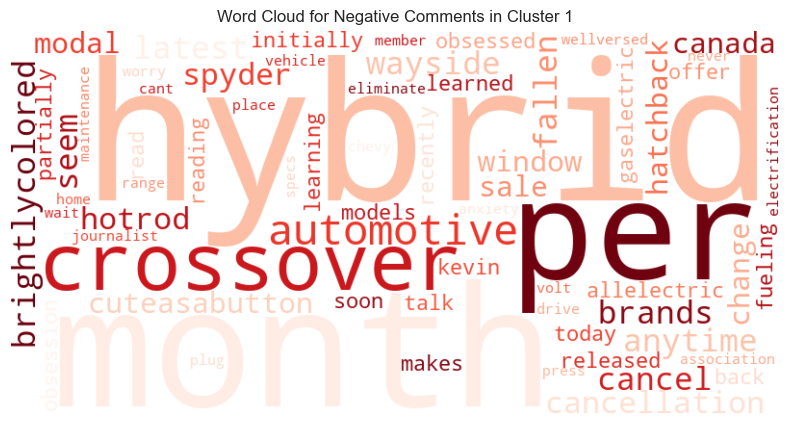

Top Negative Keywords for Cluster 1: ['month' 'anytime' 'months' 'cancel' 'hybrid' 'crossover' 'automotive'
 'allelectric' 'read' 'range']


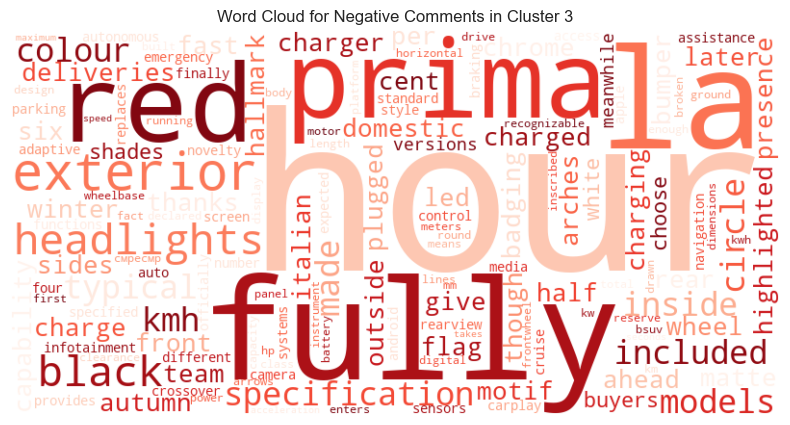

Top Negative Keywords for Cluster 3: ['kmh' 'typical' 'red' 'included' 'black' 'prima' 'exterior' 'la' 'models'
 'headlights']


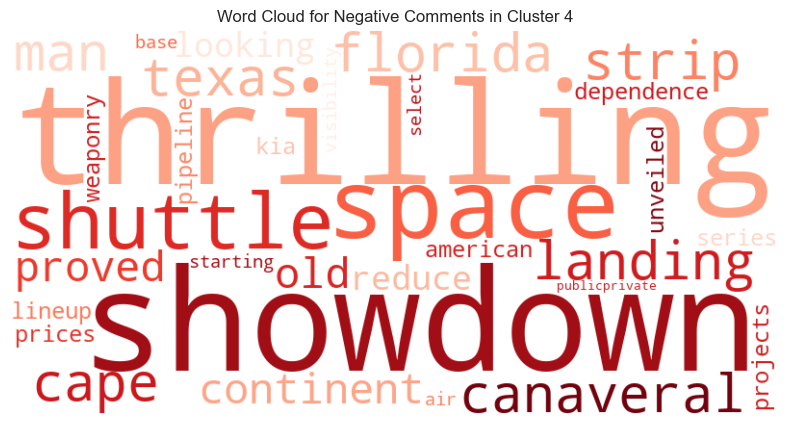

Top Negative Keywords for Cluster 4: ['air' 'american' 'visibility' 'unveiled' 'thrilling' 'texas' 'strip'
 'starting' 'space' 'shuttle']


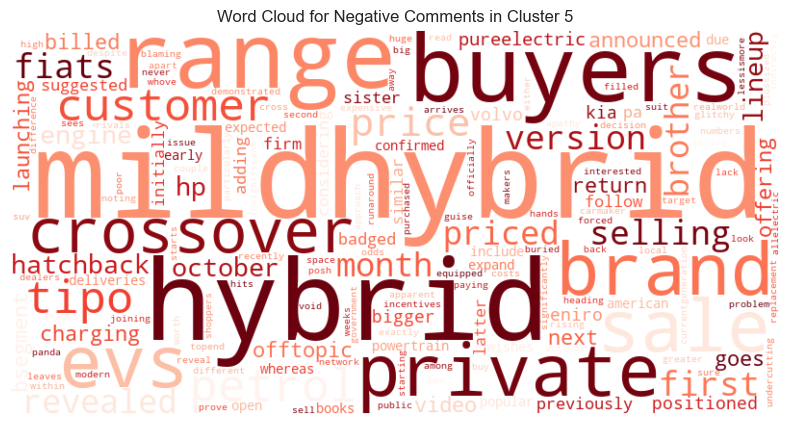

Top Negative Keywords for Cluster 5: ['mildhybrid' 'customer' 'brand' 'tipo' 'hatchback' 'priced' 'october'
 'hybrid' 'petrol' 'hp']

Negative Keywords by Cluster:
Cluster 0: []
Cluster 1: ['month' 'anytime' 'months' 'cancel' 'hybrid' 'crossover' 'automotive'
 'allelectric' 'read' 'range']
Cluster 2: []
Cluster 3: ['kmh' 'typical' 'red' 'included' 'black' 'prima' 'exterior' 'la' 'models'
 'headlights']
Cluster 4: ['air' 'american' 'visibility' 'unveiled' 'thrilling' 'texas' 'strip'
 'starting' 'space' 'shuttle']
Cluster 5: ['mildhybrid' 'customer' 'brand' 'tipo' 'hatchback' 'priced' 'october'
 'hybrid' 'petrol' 'hp']
Cluster 6: []


In [26]:
# Function to generate a word cloud
def generate_word_cloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Function to get top keywords
def get_top_keywords(tfidf_matrix, feature_names, top_n=10):
    sums = tfidf_matrix.sum(axis=0)
    data = []
    for col, term in enumerate(feature_names):
        data.append((term, sums[0, col]))
    ranking = pd.DataFrame(data, columns=['term', 'tfidf'])
    top_keywords = ranking.sort_values('tfidf', ascending=False).head(top_n)
    return top_keywords['term'].values

# Sort clusters to ensure they are in the correct order
sorted_clusters = sorted(opinionLeaders600['Cluster'].unique())

# Initialise dictionary to hold negative keywords by cluster
negative_keywords_by_cluster = {}

# Iterate over each sorted cluster and process negative comments
for cluster_num in sorted_clusters:
    cluster_data = opinionLeaders600[(opinionLeaders600['Cluster'] == cluster_num) & (opinionLeaders600['Sentiment_Category'] == 'negative')]
    
    if not cluster_data.empty:
        # Apply TF-IDF vectorizer to the negative comments in the current cluster
        tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
        X_tfidf = tfidf_vectorizer.fit_transform(cluster_data['Processed_Text'])
        
        # Get the feature names from the TF-IDF vectorizer
        feature_names = tfidf_vectorizer.get_feature_names_out()
        
        # Get top negative keywords for the current cluster
        top_negative_keywords = get_top_keywords(X_tfidf, feature_names, top_n=10)
        
        # Save the top negative keywords for the current cluster
        negative_keywords_by_cluster[cluster_num] = top_negative_keywords
        
        # Generate word cloud for negative comments
        negative_text = ' '.join(cluster_data['Processed_Text'])
        generate_word_cloud(negative_text, f'Word Cloud for Negative Comments in Cluster {cluster_num}')
        
        print(f"Top Negative Keywords for Cluster {cluster_num}: {top_negative_keywords}")
    else:
        negative_keywords_by_cluster[cluster_num] = []

# Print all negative keywords for review
print("\nNegative Keywords by Cluster:")
for cluster_num in sorted_clusters:
    print(f"Cluster {cluster_num}: {negative_keywords_by_cluster[cluster_num]}")


#### Insights from Negative Keywords Analysis for Opinion Leaders:

##### **Cluster 0:**
- **Top Negative Keywords:** None identified.
- **Insights:** This cluster does not contain strong negative sentiment, leading to no significant negative keywords.

##### **Cluster 1:**
- **Top Negative Keywords:** 'month', 'anytime', 'months', 'cancel', 'hybrid', 'crossover', 'automotive', 'allelectric', 'read', 'range'.
- **Insights:** The focus is on time-related concerns ('month', 'months', 'anytime') and skepticism about hybrid and electric vehicles ('hybrid', 'crossover', 'allelectric'). The keywords suggest concerns about availability, the shift to electric vehicles, and possibly the information being read about these topics.

##### **Cluster 2:**
- **Top Negative Keywords:** None identified.
- **Insights:** Similar to Cluster 0, this cluster does not have strong negative sentiment.

##### **Cluster 3:**
- **Top Negative Keywords:** 'kmh', 'typical', 'red', 'included', 'black', 'prima', 'exterior', 'la', 'models', 'headlights'.
- **Insights:** This cluster includes comments with a focus on specific features and design elements ('red', 'black', 'headlights'). The sentiment might reflect dissatisfaction with specific aesthetic or functional aspects of vehicles, possibly related to the Fiat 600e's design and feature set.

##### **Cluster 4:**
- **Top Negative Keywords:** 'air', 'american', 'visibility', 'unveiled', 'thrilling', 'texas', 'strip', 'starting', 'space', 'shuttle'.
- **Insights:** The keywords suggest a focus on events or experiences ('thrilling', 'unveiled', 'shuttle'). There might be dissatisfaction or criticism related to the visibility of American models, or the unveiling of certain models in specific regions ('texas', 'american').

##### **Cluster 5:**
- **Top Negative Keywords:** 'mildhybrid', 'customer', 'brand', 'tipo', 'hatchback', 'priced', 'october', 'hybrid', 'petrol', 'hp'.
- **Insights:** This cluster reflects concerns around pricing and the transition from traditional to hybrid models ('hybrid', 'mildhybrid', 'petrol', 'priced'). There may be negative sentiment towards the cost, branding, and specific models like 'tipo' and 'hatchback'.

##### **Cluster 6:**
- **Top Negative Keywords:** None identified.
- **Insights:** As with Clusters 0 and 2, this cluster does not have strong negative sentiment, indicating that the discussions are likely neutral or positive.

#### General Observations:
- **Keyword Overlap:** Some clusters have distinct themes in their negative keywords, indicating that different clusters focus on various concerns or criticisms. For instance, while Cluster 1 is more time-focused and skeptical about hybrid technology, Cluster 5 seems concerned with pricing and specific vehicle models.
- **No Keywords Identified:** The absence of keywords in Clusters 0, 2, and 6 suggests a lack of strong negative sentiment, potentially highlighting neutral or positive discourse in these clusters.

#### Deep Dive Into Clusters with Negative Sentiment

In [27]:
# Function to retrieve and print negative comments in each cluster
def get_negative_comments_by_cluster(data, cluster_num):
    cluster_data = data[(data['Cluster'] == cluster_num) & (data['Sentiment_Category'] == 'negative')]
    return cluster_data['Processed_Text']

# Loop through each cluster with identified negative sentiment and display the comments
for cluster_num in [1, 3, 4, 5]:
    print(f"\nCluster {cluster_num} - Negative Comments:")
    negative_comments = get_negative_comments_by_cluster(opinionLeaders600, cluster_num)
    for comment in negative_comments:
        print(f"- {comment}")



Cluster 1 - Negative Comments:
- per month months per month cancel anytime
- latest brightlycolored crossover brands seem fallen wayside cancellation hotrod spyder cuteasabutton hatchback crossover sale canada change modal window initially allelectric recently released gaselectric hybrid offer soon kevin obsessed talk learned read partially learning reading makes models back fueling obsession today automotive journalist member automotive press association wellversed electrification hybrid vehicle maintenance cant wait specs hybrid hybrids eliminate range anxiety drive chevy volt place never worry plug home

Cluster 3 - Negative Comments:
- thanks fast charging capability charged per cent half hour plugged domestic charger six hours fully charge autumn ahead deliveries later winter specifications la prima red exterior highlighted chrome badging front sides led headlights matte black wheel arches give presence italian flag motif rear bumper red specification models team hallmark exterio

In [31]:
# Function to extract sentences or phrases containing negative keywords
def extract_context_for_keywords(data, cluster_num, keywords):
    cluster_data = data[(data['Cluster'] == cluster_num) & (data['Sentiment_Category'] == 'negative')]
    context = []
    
    for comment in cluster_data['Processed_Text']:
        for keyword in keywords:
            if keyword in comment:
                start = max(0, comment.find(keyword) - 30)
                end = min(len(comment), comment.find(keyword) + 30)
                context.append(comment[start:end])
    
    return context

# Analyse context for clusters with identified negative sentiment
for cluster_num, keywords in negative_keywords_by_cluster.items():
    if len(keywords) > 0:  # Check if there are any keywords
        print(f"\nCluster {cluster_num} - Context for Negative Keywords:")
        context = extract_context_for_keywords(opinionLeaders600, cluster_num, keywords)
        for phrase in context:
            print(f"- {phrase}")




Cluster 1 - Context for Negative Keywords:
- per month months per month cancel 
- month months per month cancel anytime
- per month months per month cancel anytim
- per month months per month cancel anytime
- er brands seem fallen wayside cancellation hotrod spyder cut
- recently released gaselectric hybrid offer soon kevin obsess
- latest brightlycolored crossover brands seem fallen w
-  back fueling obsession today automotive journalist member a
- change modal window initially allelectric recently released 
- n kevin obsessed talk learned read partially learning readin
- pecs hybrid hybrids eliminate range anxiety drive chevy volt

Cluster 3 - Context for Negative Keywords:
- inter specifications la prima red exterior highlighted chrom
- cified four different colours included number assistance sys
- nt sides led headlights matte black wheel arches give presen
- ater winter specifications la prima red exterior highlighted
- r specifications la prima red exterior highlighted chrome ba

In [35]:
# Function to compare usage of negative keywords in positive/neutral contexts
def compare_keywords_in_sentiment_categories(data, cluster_num, keywords):
    comparison_data = data[(data['Cluster'] == cluster_num) & (data['Sentiment_Category'].isin(['positive', 'neutral']))]
    context = []
    
    for comment in comparison_data['Processed_Text']:
        for keyword in keywords:
            if keyword in comment:
                start = max(0, comment.find(keyword) - 30)
                end = min(len(comment), comment.find(keyword) + 30)
                context.append(comment[start:end])
    
    return context

# Compare keywords in positive/neutral contexts for clusters with identified negative sentiment
for cluster_num, keywords in negative_keywords_by_cluster.items():
    if len(keywords) > 0:  # Check if the list is non-empty
        print(f"\nCluster {cluster_num} - Comparison of Keywords in Positive/Neutral Contexts:")
        context = compare_keywords_in_sentiment_categories(opinionLeaders600, cluster_num, keywords)
        for phrase in context:
            print(f"- {phrase}")





Cluster 1 - Comparison of Keywords in Positive/Neutral Contexts:
- y fills minutes per cent real range miles means adding per c
- nge miles slightly petrol mildhybrid version released show c
- ing perfectly usable promises range miles slightly petrol mi
- e replenish battery half hour hybrid variant works apparentl
- markets named learn launching allelectric sized larger inten
- battery good kilometers miles range though endlessly optimis
- irst although supports petrol hybrid means previous entrylev
- cely sorted frontwheel drive ecrossover ink onto considerati
- nce garfield cat resemblance orange paint lidded lamps strai
- excellent reading prepare six months made exciting natural d
- excellent reading prepare six months made exciting natural d
-  italian first objective look crossover adding doors touch c
- live london makes excellent reading prepare six months mad
- inging leads initial thoughts range efficiency town already 
- rival updated cooper se miles range citroën buy wall


Cluster 1 - Context for Negative Keywords:


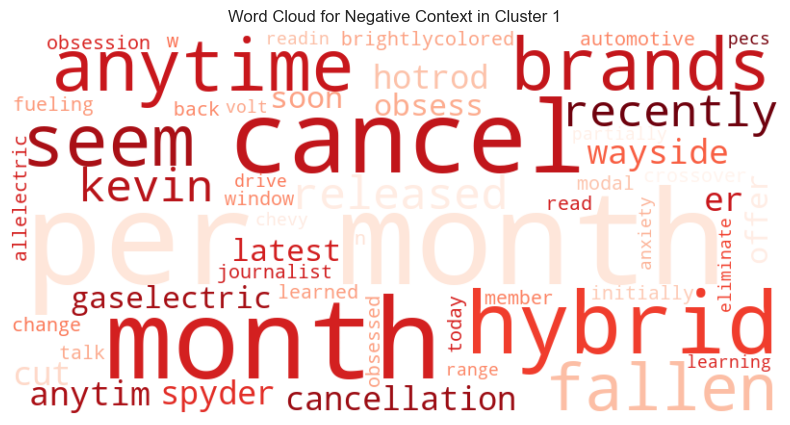

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


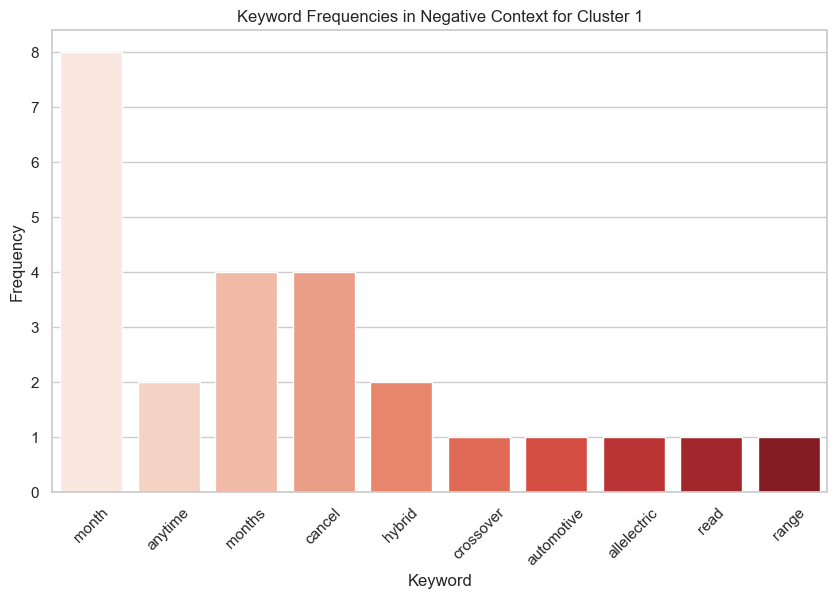

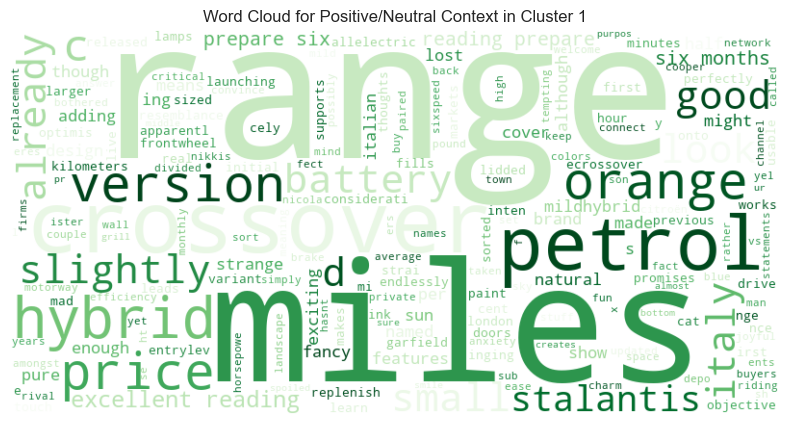

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


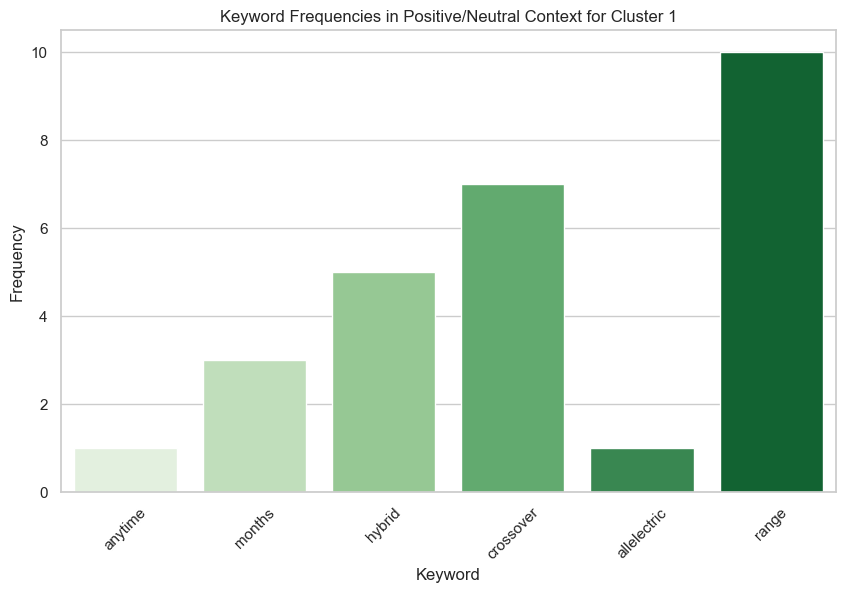


Cluster 3 - Context for Negative Keywords:


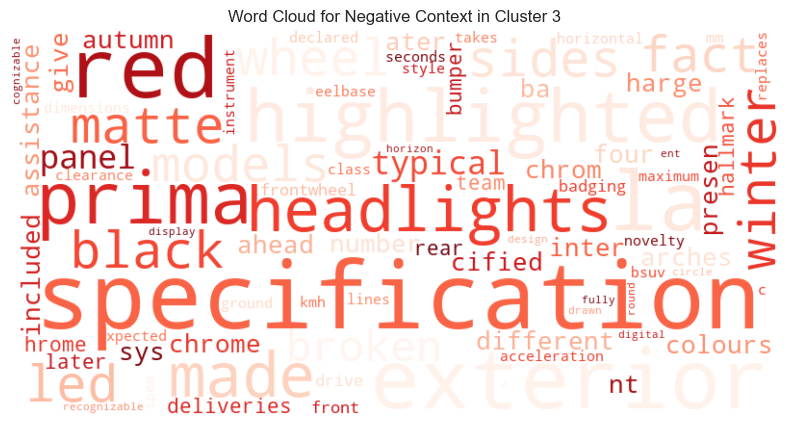

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


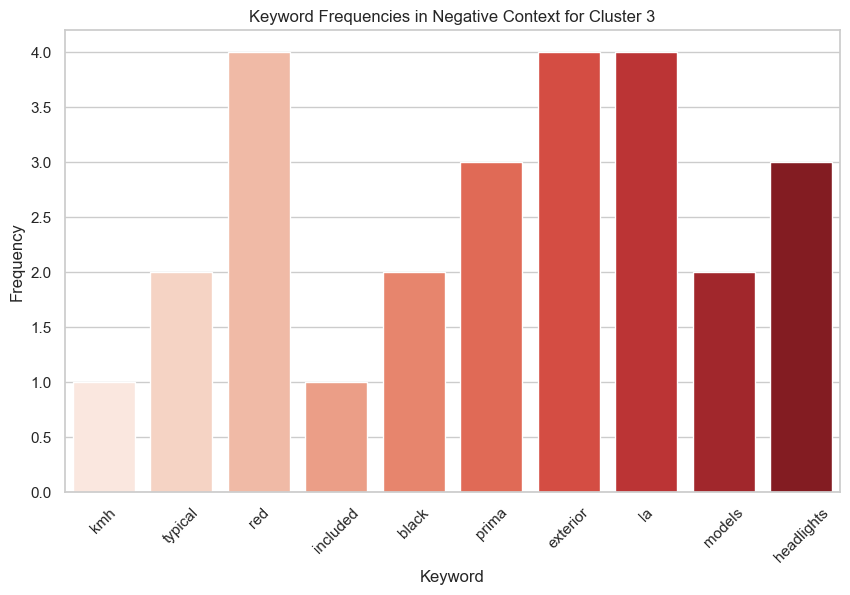

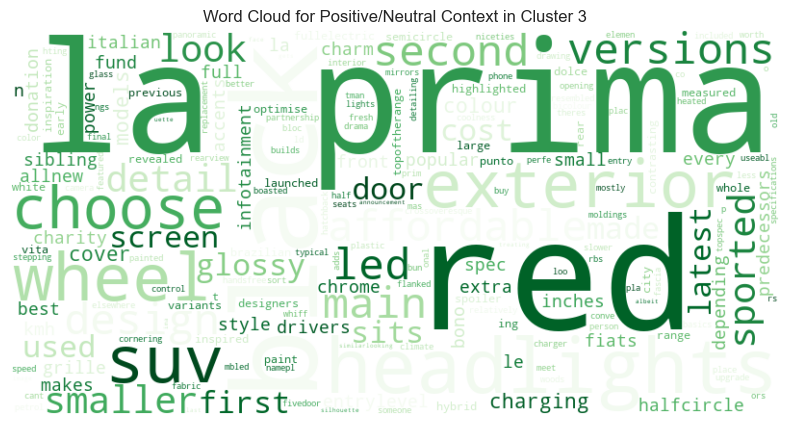

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


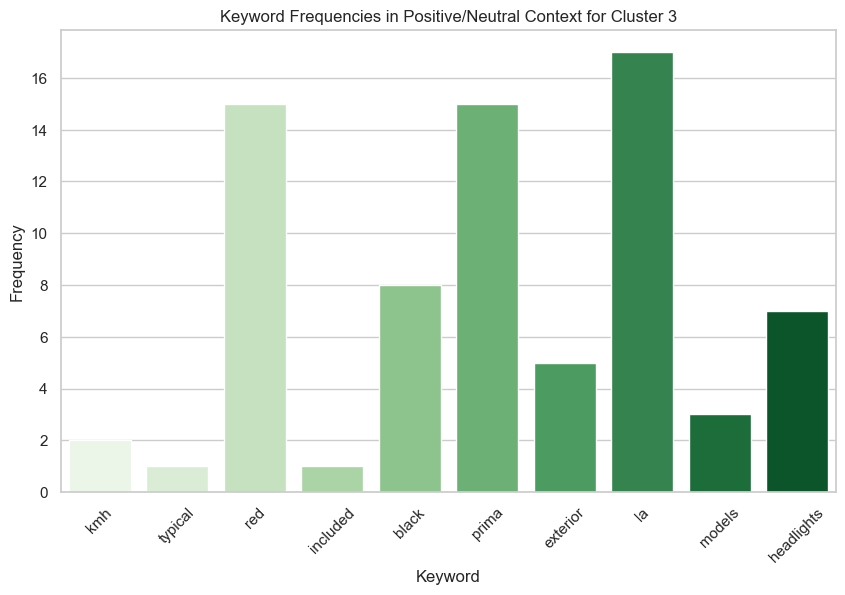


Cluster 4 - Context for Negative Keywords:


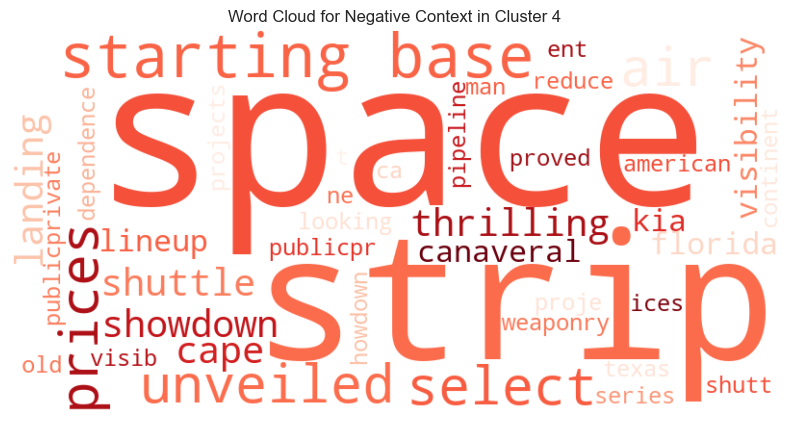

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


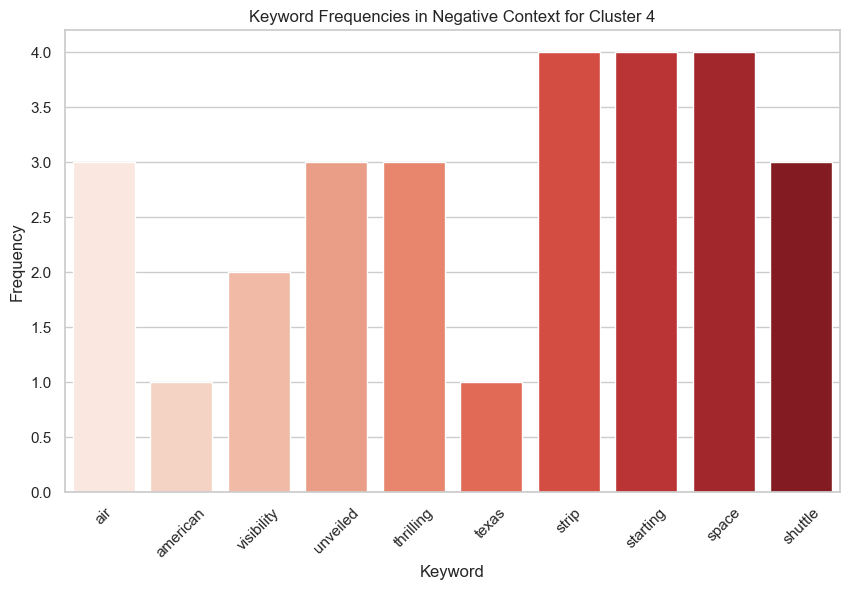

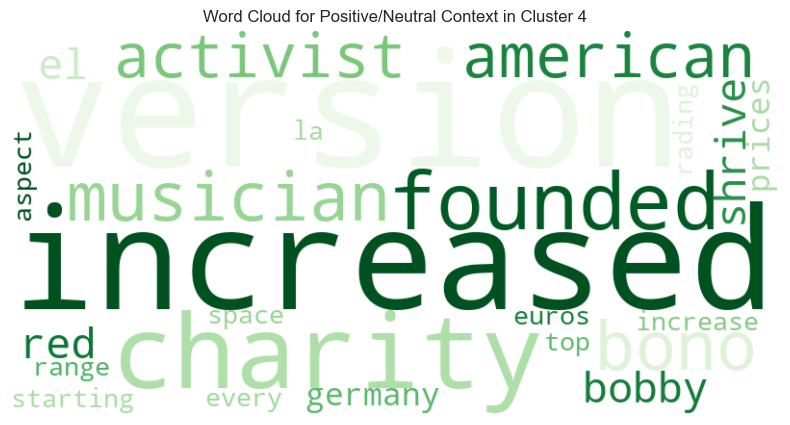

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


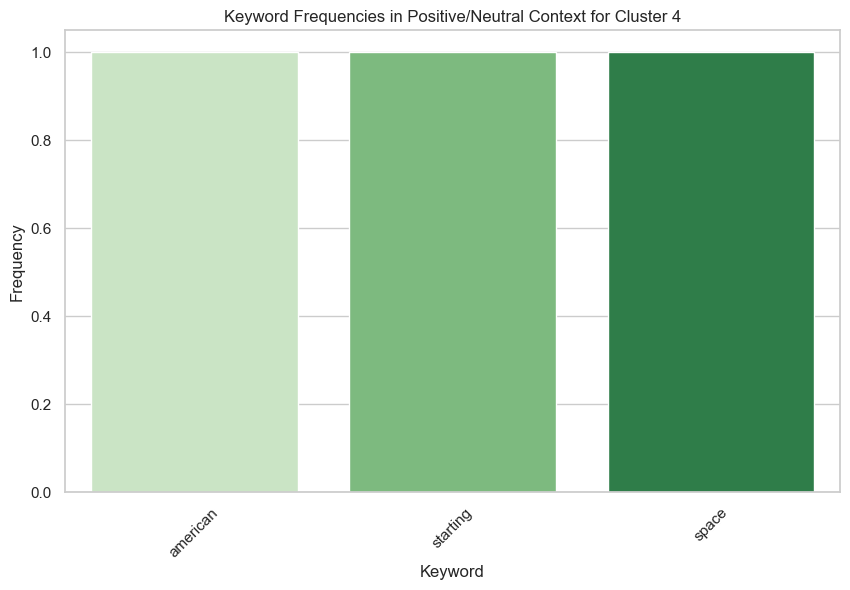


Cluster 5 - Context for Negative Keywords:


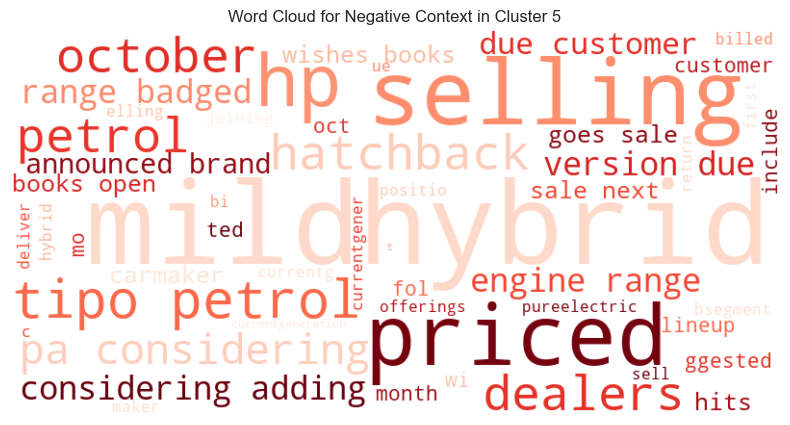

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


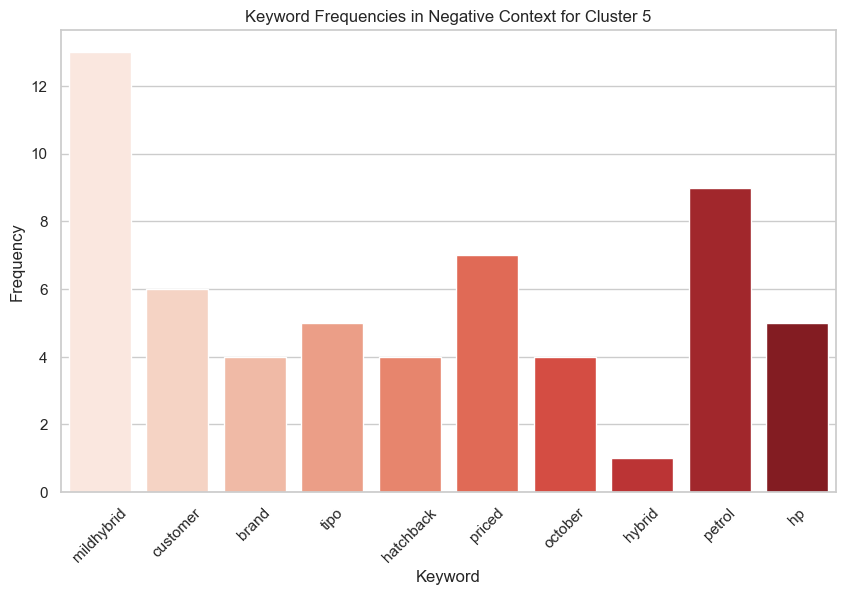

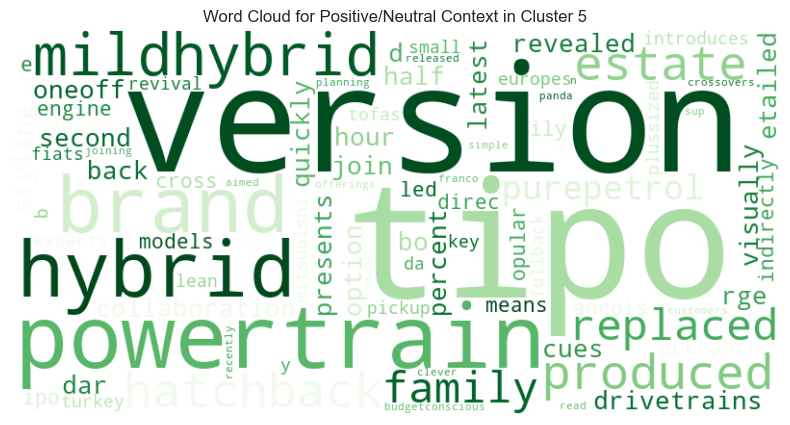

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1451478537.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)


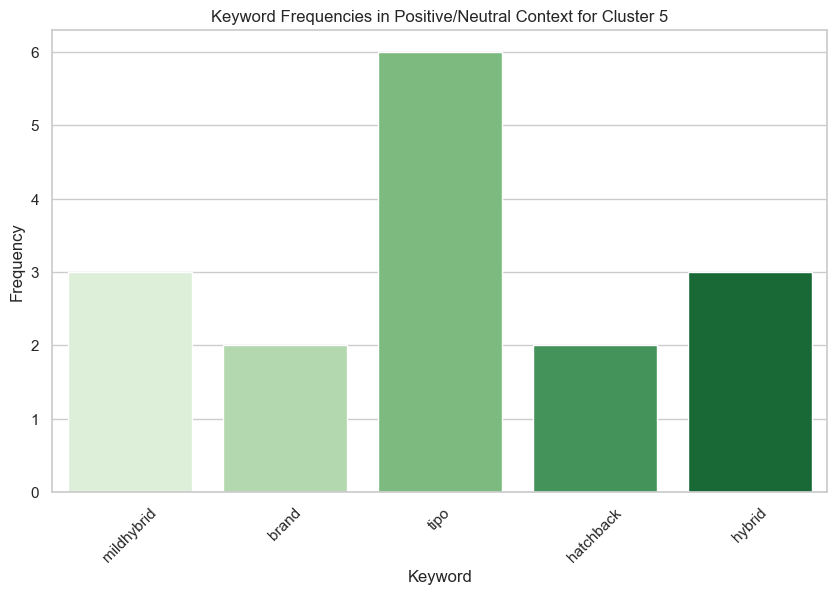

In [39]:
# Function to generate and display word clouds for given contexts
def generate_word_cloud(context, title, background_color='white', color_map='Reds'):
    text = ' '.join(context)
    wordcloud = WordCloud(width=800, height=400, background_color=background_color, colormap=color_map).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Function to plot bar charts of keyword frequencies in contexts
def plot_keyword_frequencies(keywords, context, title, color_palette='Reds'):
    keyword_freq = Counter([word for phrase in context for word in phrase.split()])
    keyword_freq = {word: keyword_freq[word] for word in keywords if word in keyword_freq}
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(keyword_freq.keys()), y=list(keyword_freq.values()), palette=color_palette)
    plt.title(title)
    plt.ylabel('Frequency')
    plt.xlabel('Keyword')
    plt.xticks(rotation=45)
    plt.show()

# Loop through each cluster with identified negative sentiment and visualise
for cluster_num, keywords in negative_keywords_by_cluster.items():
    if len(keywords) > 0:  # Check if there are any keywords
        print(f"\nCluster {cluster_num} - Context for Negative Keywords:")
        negative_context = extract_context_for_keywords(opinionLeaders600, cluster_num, keywords)
        
        # Generate word cloud for negative context with red words
        generate_word_cloud(negative_context, f'Word Cloud for Negative Context in Cluster {cluster_num}', background_color='white', color_map='Reds')
        
        # Plot keyword frequencies in negative context with red bars
        plot_keyword_frequencies(keywords, negative_context, f'Keyword Frequencies in Negative Context for Cluster {cluster_num}', color_palette='Reds')
        
        # Compare with positive/neutral contexts
        positive_neutral_context = compare_keywords_in_sentiment_categories(opinionLeaders600, cluster_num, keywords)
        
        # Generate word cloud for positive/neutral context with default green/blue words
        generate_word_cloud(positive_neutral_context, f'Word Cloud for Positive/Neutral Context in Cluster {cluster_num}', background_color='white', color_map='Greens')
        
        # Plot keyword frequencies in positive/neutral context with green bars
        plot_keyword_frequencies(keywords, positive_neutral_context, f'Keyword Frequencies in Positive/Neutral Context for Cluster {cluster_num}', color_palette='Greens')


##### Insights for Cluster 1:

1. **Negative Sentiment**:
   * The negative context in Cluster 1 is centered around words like "month," "cancel," "hybrid," and "crossover." These terms suggest that discussions or reviews focus on issues related to the timing of product releases, potential cancellations, or concerns about hybrid technology and crossover vehicles.
   * The word cloud and frequency chart highlight the most mentioned issues, with "month" and "cancel" being prominent. This could indicate dissatisfaction with subscription terms, cancellation policies, or delays related to monthly releases.

2. **Positive/Neutral Sentiment**:
   * In the positive/neutral context, the focus shifts to words like "range," "miles," "petrol," and "price." These terms suggest that discussions are more favourable when focusing on the practical aspects of the vehicles, such as mileage, price, and the overall value of petrol versus hybrid engines.
   * The prominence of "range" indicates that when the conversation is positive, the discussion is likely about the vehicle's efficiency and driving range, which is a significant selling point for consumers.

##### Insights for Cluster 3:

1. **Negative Sentiment**:
   * The negative context in Cluster 3 revolves around terms like "prima," "headlights," "red," and "specification." These words suggest dissatisfaction or criticism regarding the design elements (e.g., "headlights," "red" color scheme) and the specific configurations or trims ("prima" edition) of the vehicles.
   * "Specification" and "exterior" are frequent keywords, pointing to critiques of the vehicle's external features and detailed specifications, possibly regarding expectations versus reality.

2. **Positive/Neutral Sentiment**:
   * In the positive/neutral context, the discussion shifts to the same keywords but in a more favurable light, such as "prima," "la," and "red." These words indicate that the "prima" edition and its design elements, including "headlights" and "red" color, are well-received when discussed positively.
   * The focus on "la prima" suggests that the premium or special editions of the vehicle are particularly notable in positive reviews, highlighting the value consumers see in these features when not critiquing.

##### Insights for Cluster 4:

1. **Negative Sentiment**:
   * Cluster 4's negative context includes words like "space," "strip," "shuttle," and "thrilling." These terms suggest that there might be discontent or criticism related to the interior space, exterior design features (like "strip"), or even marketing descriptions (e.g., "thrilling") that may not align with consumer expectations.
   * "Space" is a key term here, potentially pointing to dissatisfaction with the physical space within the vehicle, or the metaphorical space it occupies in the market compared to competitors.

2. **Positive/Neutral Sentiment**:
   * The positive/neutral context for Cluster 4 is marked by terms like "increased," "version," and "charity." This indicates that the vehicle's newer versions or upgrades ("increased") and charitable associations (perhaps related to marketing campaigns) are well-received.
   * The word "founded" suggests a narrative around the brand's origins or initiatives, which might be positively associated with the brand's image.

### Insights for Cluster 5:

1. **Negative Sentiment**:
   * The negative context in Cluster 5 is dominated by words like "mildhybrid," "selling," "priced," and "petrol." These words indicate concerns or dissatisfaction with the pricing, marketing, and sales strategy of the mild-hybrid models, as well as possible issues with the petrol engine options.
   * The frequent mention of "mildhybrid" and "priced" suggests that there might be criticism related to the value proposition of the mild-hybrid vehicles, especially regarding how they are priced or positioned in the market.

2. **Positive/Neutral Sentiment**:
   * In the positive/neutral context, the focus shifts to words like "version," "powertrain," and "tipo." These terms highlight that when discussed favourably, the emphasis is on the different versions of the vehicle, especially those with specific powertrain options like the mild-hybrid, and the "tipo" model.
   * The mention of "estate" and "replaced" suggests that positive reviews may focus on how the vehicle or its features have improved or replaced older models, contributing to a sense of progress or evolution.

In [64]:
# Add 'Date' columns from the original table
date_map = dict(zip(opinionLeaders600_original['ID'], opinionLeaders600_original['Date']))
opinionLeaders600['Date'] = opinionLeaders600['ID'].map(date_map)

# Preprocess the Date column
opinionLeaders600['Date'] = pd.to_datetime(opinionLeaders600['Date'])

# Ensure text data is clean
opinionLeaders600['Text'] = opinionLeaders600['Text'].astype(str)

# Display the first few rows of the DataFrame
print(opinionLeaders600.head())

                                                  ID  \
0  https://news.google.com/articles/CBMiHmh0dHBzO...   
1  https://news.google.com/articles/CBMiJ2h0dHBzO...   
2  https://news.google.com/articles/CBMiJ2h0dHBzO...   
3  https://news.google.com/articles/CBMiKWh0dHBzO...   
4  https://news.google.com/articles/CBMiNGh0dHBzO...   

                                                Text  \
0  JAKARTA - Fiat recently revealed their latest ...   
1  Customers asked for more crossovers, and Fiat ...   
2  \nRelatively affordable to buy. Very useable 2...   
3  4.0 out of 5 The ‘Frappuccino' of the small el...   
4  There are two specifications available on the ...   

                                      Processed_Text  Cluster  Sentiment  \
0  jakarta recently revealed latest suv name elec...        6     0.8957   
1  customers asked crossovers answer request bett...        3     0.9871   
2  relatively affordable buy useable range topspe...        3     0.9996   
3  frappuccino small s

<Figure size 1400x700 with 0 Axes>

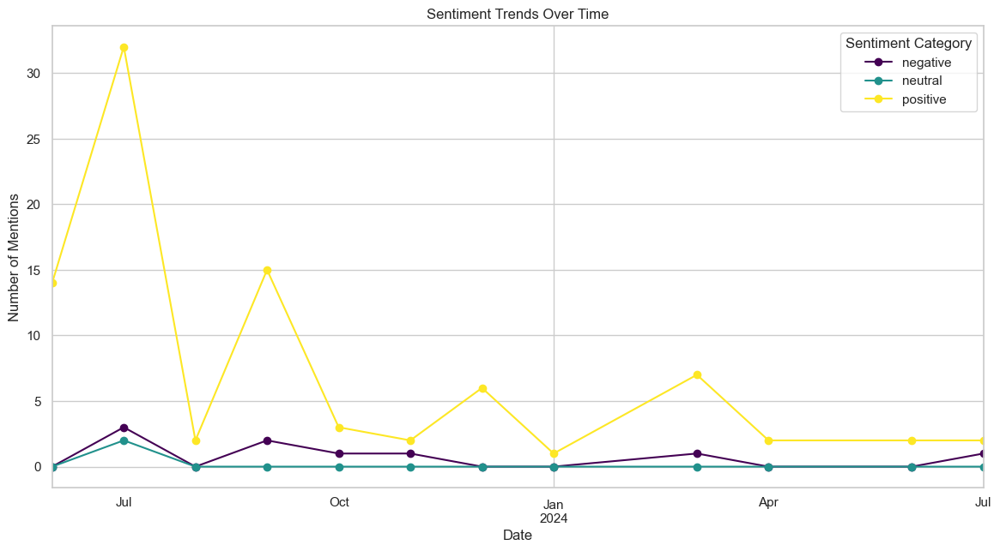

In [65]:
# Analyse the sentiment trends over time
# Convert 'Date' to datetime format for plotting
opinionLeaders600['Date'] = pd.to_datetime(opinionLeaders600['Date'])

# Group data by date and sentiment category
sentiment_trends = opinionLeaders600.groupby([opinionLeaders600['Date'].dt.to_period('M'), 'Sentiment_Category']).size().unstack().fillna(0)

# Plotting the sentiment trends over time
plt.figure(figsize=(14, 7))
sentiment_trends.plot(kind='line', marker='o', figsize=(14, 7), linestyle='-', colormap='viridis')
plt.title('Sentiment Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Mentions')
plt.legend(title='Sentiment Category')
plt.grid(True)
plt.show()


* **Positive sentiment** clearly dominates across the timeline, particularly in the earlier months. The sharp peak in July suggests likely correlate with the announcement of Fiat600. There is a noticeable drop in positive mentions after July, but the sentiment remains the highest compared to neutral and negative sentiments.

* **Negative sentiment** appears to fluctuate slightly but remains relatively low throughout the timeline. This indicates that while there are occasional spikes in negative feedback, it is not prevalent or sustained. The slight increase in negative sentiment around September and December could correlate with specific events, product issues, or criticisms that led to more negative mentions.

* **Neutral sentiment** remains fairly consistent and low throughout the timeline, with no significant peaks. This suggests that most opinion leaders are either strongly positive or negative in their coverage, with few neutral takes.


# 600e Potential Customers: Comments 

In [83]:
comments_600e_original = pd.read_csv('600e - Potential Customers_20240802.csv')
comments_600e = comments_600e_original.copy()
comments_600e.head()

,Date,ID,Text
0,2024-03-08,AXGNb76QgH0,25000 is a fair price
1,2024-03-04,AXGNb76QgH0,it looks solid and i know its a great driving ...
2,2024-02-24,AXGNb76QgH0,really love the video and review of new fiat 6...
3,2024-02-16,AXGNb76QgH0,imagine if fiat invested in perfecting the 500...
4,2024-02-13,AXGNb76QgH0,my wife has a 500 c and all we love it nobody ...


In [84]:
# Check length of the dataframe
len(comments_600e)

1148

#### Finding the Optimal Number of Clusters

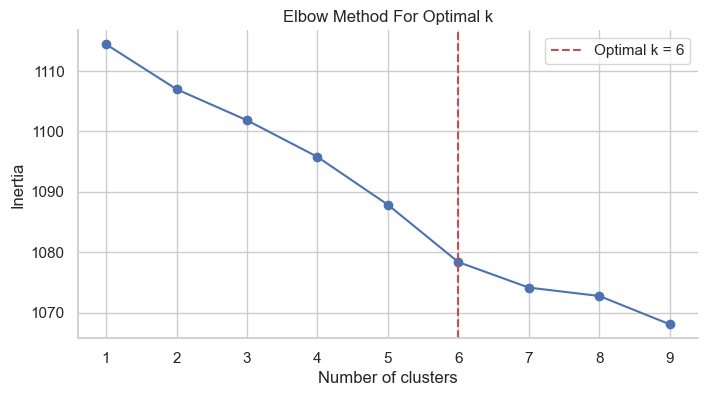

The optimal number of clusters based on the Elbow Method is: 6


In [85]:
# Rename columns
comments_600e.rename(columns={'VideoID': 'ID', 'Comment': 'Text'}, inplace=True)

# Custom stopwords
custom_stopwords = set(stopwords.words('english')).union({'car', 'cars', 
                             'black', 'grey', 'uh', 'yes', 'go', 'e', 'oh', 'still', 'chinese', 'ice', 'dont', 'doesnt', 'less',
                             'fiat', 'jeep', 'avenger', 'abarth', 'stellantis', 'hyundai', 'honda', 'kona','kind', 'want', 'mean', 'fat','um', 'yeah', 'okay',
                             'one', 'content', 'information', 'interests', 'activity', 'notice', 'also', 'would', 'going', 'be', 'much', 'comes',
                             'like', 'bit', 'quite', 'lot', 'well', 'really', 'get', 'got', 'little', 'feeling', 'think', 'actually',
                             'even', 'however', 'around', 'see', 'know',
                             'presented', 'example'})

# Preprocess function
def preprocess(text):
    if isinstance(text, str):
        text = re.sub(r'\b\w{1,2}\b', '', text)  # Remove short words
        tokens = nltk.word_tokenize(text.lower())
        tokens = [word for word in tokens if word.isalpha() and word not in custom_stopwords]
        return tokens
    else:
        return []

# Processing the documents
processed_docs = [" ".join(preprocess(doc)) for doc in comments_600e['Text']]

# Initialize the TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words=list(custom_stopwords))  # Convert stopwords to list
X_tfidf = tfidf_vectorizer.fit_transform(processed_docs)

# Apply the Elbow Method
inertia = []
K_range = range(1, 10)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_tfidf)
    inertia.append(kmeans.inertia_)

# Find the "elbow" point
def find_elbow(inertia, K_range):
    slopes = np.diff(inertia)
    optimal_k = np.argmax(np.diff(slopes)) + 2  # +2 because np.diff reduces the array size by 1 and we start from k=2
    return optimal_k

optimal_k_elbow = find_elbow(inertia, K_range)

# Plotting the inertia to find the elbow
plt.figure(figsize=(8, 4))
plt.plot(K_range, inertia, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.axvline(x=optimal_k_elbow, color='r', linestyle='--', label=f'Optimal k = {optimal_k_elbow}')
plt.legend()
# Remove spines and display the plot
sns.despine()
plt.show()

print(f"The optimal number of clusters based on the Elbow Method is: {optimal_k_elbow}")

#### Apply K-means Clustering

In [86]:
# Apply K-Means Clustering on the TF-IDF matrix
kmeans = KMeans(n_clusters=optimal_k_elbow, random_state=42)
clusters = kmeans.fit_predict(X_tfidf)

# Add the cluster labels to your original DataFrame
comments_600e['Cluster'] = clusters

# Display the DataFrame with the new cluster column
print(comments_600e[['Text', 'Cluster']].head())

                                                Text  Cluster
0                              25000 is a fair price        0
1  it looks solid and i know its a great driving ...        4
2  really love the video and review of new fiat 6...        5
3  imagine if fiat invested in perfecting the 500...        3
4  my wife has a 500 c and all we love it nobody ...        0


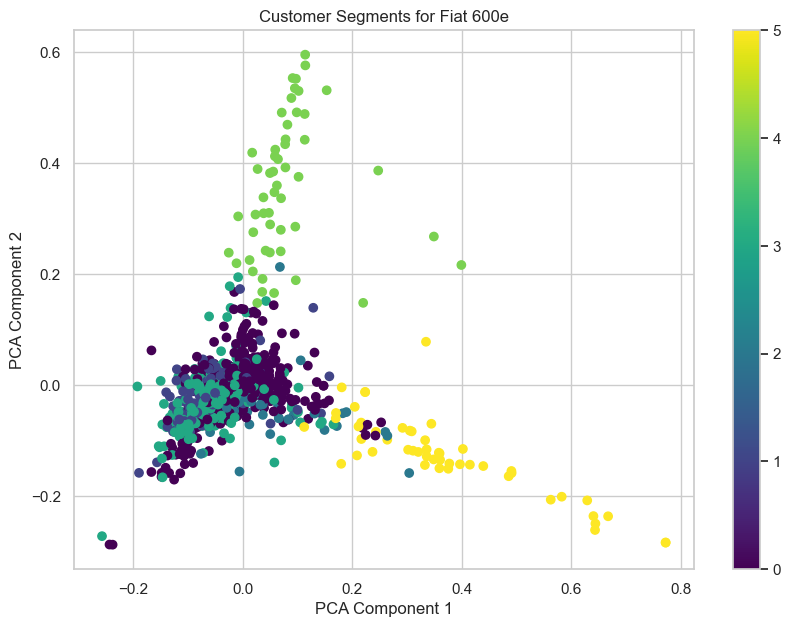

In [87]:
X = tfidf_vectorizer.fit_transform(comments_600e['Text'])

# Visualise clusters
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X.toarray())
plt.figure(figsize=(10, 7))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=comments_600e['Cluster'], cmap='viridis')
plt.title('Customer Segments for Fiat 600e')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar()
plt.show()


1. **Distinct Clusters:**
   - The scatter plot shows distinct clusters of data points, which suggest the presence of different customer segments. These clusters are color-coded based on the assigned segment number (0-5).
   - The yellow points (cluster 5) are more spread out and positioned distinctly towards the right side of the PCA Component 1 axis, indicating that this segment might have unique characteristics compared to the other segments.

2. **Cluster 1 (Yellow Points):**
   - The yellow points, which represent cluster 1, are more dispersed along the PCA Component 1 axis and slightly separated from the denser clusters in the middle. This suggests that customers in this segment might have preferences or behaviors that differ significantly from other segments.
   - These customers might be early adopters or those with specific needs and preferences for the Fiat 600e.

3. **Core Cluster (Purple and Blue Points):**
   - The dense core of points in the lower-left region (primarily clusters 0 and 2) suggests that these segments have customers with similar profiles. These segments might represent the mainstream or majority customers who share common attributes or preferences.
   - These customers might be less varied in their needs or are generally aligned with the typical target market for the Fiat 600e.

4. **Middle Segments (Green and Teal Points):**
   - The green and teal points represent segments that occupy the middle ground in the PCA space. These segments might represent customers with more moderate or mixed preferences.
   - They could be considering the Fiat 600e but may require more targeted marketing or specific product features to convert them fully.

#### Sentiment Analysis

/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/1034255970.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Cluster', y='Sentiment', data=comments_600e, palette='viridis')


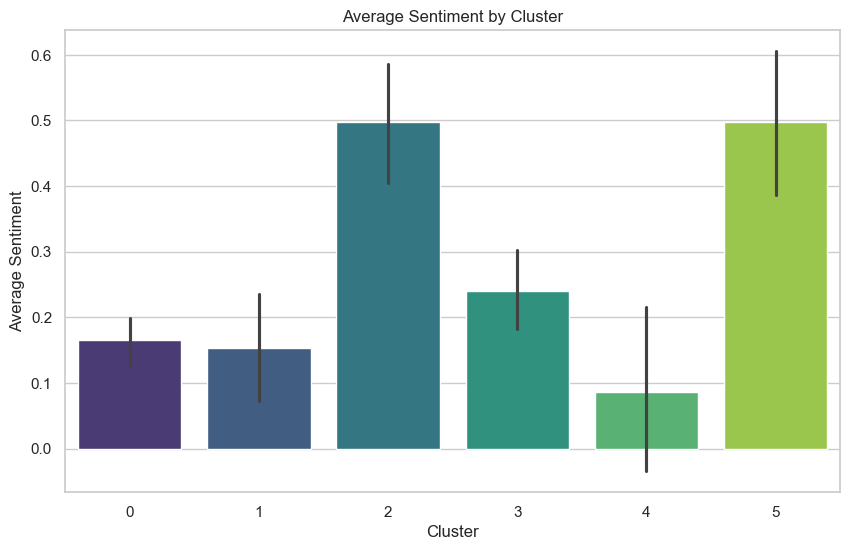

In [88]:
# Initialize VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Apply sentiment analysis to each processed text
comments_600e['Sentiment'] = comments_600e['Text'].apply(lambda x: sia.polarity_scores(x)['compound'])

# Calculate average sentiment score for each cluster
average_sentiment_by_cluster = comments_600e.groupby('Cluster')['Sentiment'].mean()

# Categorize sentiment
def categorize_sentiment(score):
    if score > 0.05:
        return 'positive'
    elif score < -0.05:
        return 'negative'
    else:
        return 'neutral'

comments_600e['Sentiment_Category'] = comments_600e['Sentiment'].apply(categorize_sentiment)

# Calculate sentiment distribution for each cluster
sentiment_distribution_by_cluster = comments_600e.groupby(['Cluster', 'Sentiment_Category']).size().unstack().fillna(0)

# Plot the sentiment by cluster
plt.figure(figsize=(10, 6))
sns.barplot
sns.barplot(x='Cluster', y='Sentiment', data=comments_600e, palette='viridis')
plt.title('Average Sentiment by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Sentiment')
# Add spines back to the plot

plt.show()


1. **Clusters 2 and 5 Are the Most Positive:**
   - Clusters 2 and 5 have the highest average sentiment scores, indicating that the potential customers in these segments have more positive sentiments towards the Fiat 600e.
   - Cluster 2 shows an average sentiment score of around 0.5, while Cluster 5 is slightly lower but still significantly positive.

2. **Cluster 4 Is the Most Negative:**
   - Cluster 4 has the lowest average sentiment score, with an average close to zero, indicating generally negative or neutral sentiment among these potential customers.
   - The low sentiment in this cluster suggests that these customers might have concerns or reservations about the Fiat 600e, which could be related to specific product features or market perceptions.

3. **Moderate Sentiment in Clusters 0, 1, and 3:**
   - Clusters 0, 1, and 3 have moderate average sentiment scores, hovering around 0.1 to 0.3. These clusters show mixed feelings about the Fiat 600e, with some positive and some negative feedback.
   - The error bars in these clusters suggest variability, meaning that opinions within these clusters are less consistent compared to Clusters 2 and 5.

4. **Variability in Sentiment:**
   - The error bars indicate the range of sentiment within each cluster. Clusters 2 and 5 show wider error bars, implying a broader range of sentiment within these clusters, from very positive to somewhat less positive.
   - Cluster 4, despite being the most negative overall, also has a notable range of sentiment variability, indicating that not all customers in this segment are entirely negative.

#### Detailed Cluster Analysis

In [89]:
# Extract top keywords for each cluster and sample comments
comments_600e['Processed_Text'] = comments_600e['Text'].apply(preprocess)

# Ensure 'Processed_Text' column exists and is processed as a string
# Assuming 'Processed_Text' is currently a list of tokens, convert it back to a string
comments_600e['Processed_Text'] = comments_600e['Processed_Text'].apply(lambda x: ' '.join(eval(x)) if isinstance(x, str) else ' '.join(x))

# Fitting the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X_tfidf = tfidf_vectorizer.fit_transform(comments_600e['Processed_Text'])
clusters = comments_600e['Cluster']
num_clusters = clusters.nunique()

# Function to get top keywords for each cluster
def get_top_keywords(tfidf_matrix, clusters, feature_names, top_n=10):
    df = pd.DataFrame(tfidf_matrix.todense()).groupby(clusters).mean()
    valid_indices = range(len(feature_names))  # Ensure indices are within the valid range
    return df.apply(lambda x: [feature_names[i] for i in x.argsort() if i in valid_indices][-top_n:], axis=1)

# Get the feature names from the TF-IDF vectorizer
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get top keywords for each cluster
top_keywords_by_cluster = get_top_keywords(X_tfidf, clusters, feature_names)

# Extract sample articles and common themes
for cluster_num in range(num_clusters):
    print(f"Cluster {cluster_num}:")
    cluster_data = comments_600e[comments_600e['Cluster'] == cluster_num]
    
    # Check if the cluster has enough data points to sample
    if len(cluster_data) >= 3:
        sample_articles = cluster_data.sample(3)  # Get 3 sample articles for each cluster
    else:
        sample_articles = cluster_data  # Take all articles if fewer than 3
    
    common_words = top_keywords_by_cluster[cluster_num]
    
    print("Sample Articles:")
    for _, row in sample_articles.iterrows():
        print(f" - {row['Text']}")
    
    print(f"Common Words: {common_words}")
    print(f"Average Sentiment: {average_sentiment_by_cluster[cluster_num]}")
    print(f"Sentiment Distribution: \n{sentiment_distribution_by_cluster.loc[cluster_num]}")
    print("\n")


Cluster 0:
Sample Articles:
 - this isnt a strip show you dont need to build anticipation start with the price and specs
 - fiat fix it again tony was plagued with reliable issues electrical transmission and engine in its ice vehicles
 - i turned off when i heard the price 33k sorry
Common Words: ['way', 'love', 'need', 'buy', 'ive', 'time', 'small', 'looks', 'good', 'price']
Average Sentiment: 0.16548426763110308
Sentiment Distribution: 
Sentiment_Category
negative    129
neutral     154
positive    270
Name: 0, dtype: int64


Cluster 1:
Sample Articles:
 - are there any cheap new electric cars is the wuling bingo available in uk or europe
 - 33 grand haha are you seriously telling me a fiat punto one of the cheapest cars on the planet has now developed into a car worth more tha a jaguar or mercedes or even a porche i can buy a top notch top of the range super duper car for the price of this orange cameflaged milk float it is getting ridiculous now
 - i mean the urban range is great a

In [90]:
# Function to get top keywords
def get_top_keywords(tfidf_matrix, feature_names, top_n=10):
    sums = tfidf_matrix.sum(axis=0)
    data = []
    for col, term in enumerate(feature_names):
        data.append((term, sums[0, col]))
    ranking = pd.DataFrame(data, columns=['term', 'tfidf'])
    top_keywords = ranking.sort_values('tfidf', ascending=False).head(top_n)
    return top_keywords['term'].values

# Filter comments with negative sentiment (e.g., sentiment score below 0)
truly_negative_comments = comments_600e[comments_600e['Sentiment'] < 0]

# Initialise dictionary to hold negative keywords by cluster
negative_keywords_by_cluster = {}

# Iterate over each cluster and process negative comments
for cluster_num in range(num_clusters):
    cluster_data = truly_negative_comments[truly_negative_comments['Cluster'] == cluster_num]
    
    if not cluster_data.empty:
        # Apply TF-IDF vectorizer to the negative comments in the current cluster
        tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
        X_tfidf = tfidf_vectorizer.fit_transform(cluster_data['Processed_Text'])
        
        # Get the feature names from the TF-IDF vectorizer
        feature_names = tfidf_vectorizer.get_feature_names_out()
        
        # Get top negative keywords for the current cluster
        top_negative_keywords = get_top_keywords(X_tfidf, feature_names, top_n=10)
        
        # Save the top negative keywords for the current cluster
        negative_keywords_by_cluster[cluster_num] = top_negative_keywords
        
# Extract sample comments and common themes
for cluster_num, keywords in negative_keywords_by_cluster.items():
    print(f"\nCluster {cluster_num}:")
    cluster_data = truly_negative_comments[truly_negative_comments['Cluster'] == cluster_num]
    
    # Check if the cluster has enough data points to sample
    if len(cluster_data) >= 3:
        sample_comments = cluster_data.sample(3)  # Get 3 sample comments for each cluster
    else:
        sample_comments = cluster_data  # Take all comments if fewer than 3
    
    common_words = negative_keywords_by_cluster[cluster_num]
    
    print("Sample Comments:")
    for _, row in sample_comments.iterrows():
        print(f" - {row['Text']}")
    
    print(f"Common Words: {common_words}")
    print(f"Average Sentiment: {average_sentiment_by_cluster[cluster_num]}")
    print(f"Sentiment Distribution: \n{sentiment_distribution_by_cluster.loc[cluster_num]}")
    print("\n")

# Print all negative keywords for review
print("\nNegative Keywords by Cluster:")
for cluster_num, keywords in negative_keywords_by_cluster.items():
    print(f"Cluster {cluster_num}: {keywords}")



Cluster 0:
Sample Comments:
 - i dislike cars with faces too
 - im a consumer and im desperate for the smallest cheapest ev i can get i do not care about more than two seats or honestly more than one i do not care about having more than 250 litres of boot space because thats a shopping trolley or more anyway id never buy an suv not even with your money
 - forget mg4 there is estate car mg5 plus the zs which is a crossover
Common Words: ['price' 'tesla' 'battery' 'poor' 'buy' 'need' 'time' 'ugly' 'drive'
 'overpriced']
Average Sentiment: 0.16548426763110308
Sentiment Distribution: 
Sentiment_Category
negative    129
neutral     154
positive    270
Name: 0, dtype: int64



Cluster 1:
Sample Comments:
 - its not cheap or affordable for most people and stellantis still not using a ev specifuc platfrom chinese must be shaking in their boots 😂
 - that costs more than i paid for my exdealer demo audi a4 avant sline dsg with only 190 miles on the clock and for an ugly little fiat dont ever te

Generating word clouds for Cluster 0...


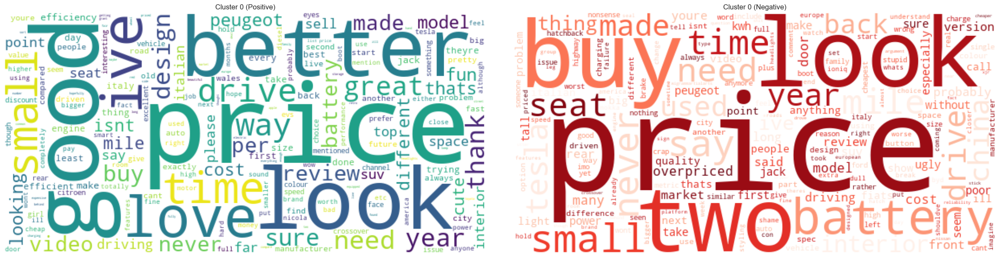

Generating word clouds for Cluster 1...


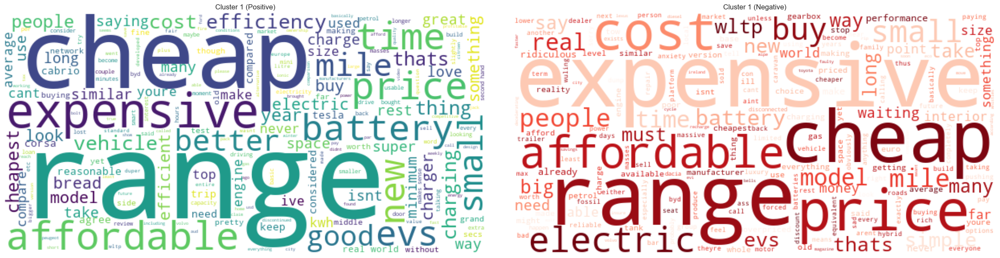

Generating word clouds for Cluster 2...


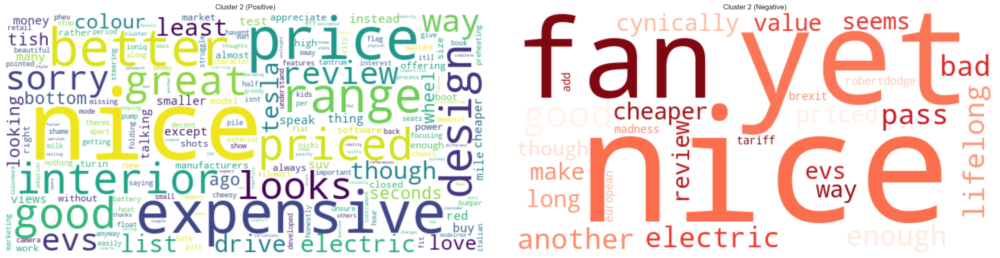

Generating word clouds for Cluster 3...


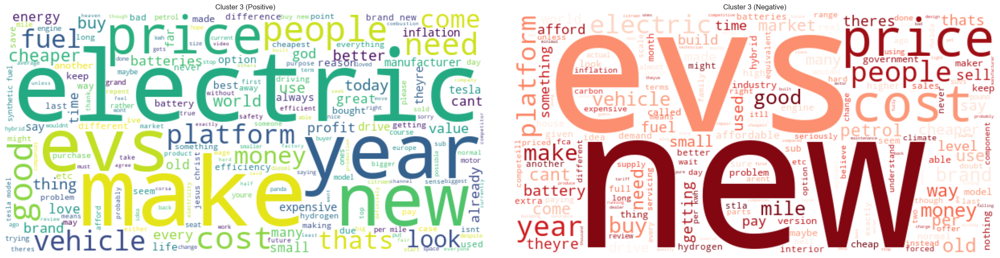

Generating word clouds for Cluster 4...


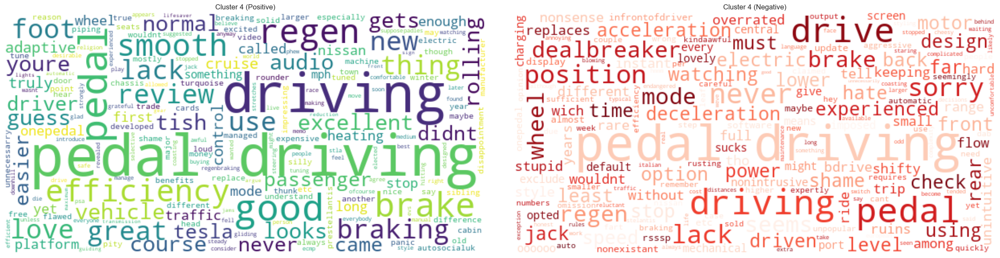

Generating word clouds for Cluster 5...


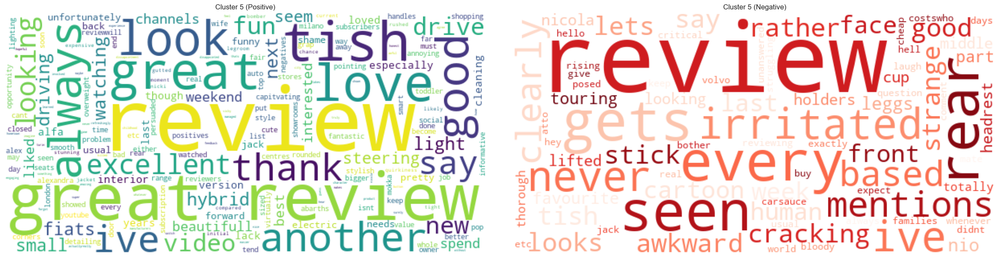

In [93]:
# Ensure 'Processed_Text' column is processed as a string
comments_600e['Processed_Text'] = comments_600e['Processed_Text'].apply(lambda x: ' '.join(x) if isinstance(x, list) else str(x))

# Fitting the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X_tfidf = tfidf_vectorizer.fit_transform(comments_600e['Processed_Text'])
clusters = comments_600e['Cluster']
num_clusters = clusters.nunique()

# Corrected function to get top keywords for each cluster
def get_top_keywords(tfidf_matrix, clusters, feature_names, top_n=10):
    df = pd.DataFrame(tfidf_matrix.todense()).groupby(clusters).mean()
    valid_indices = range(len(feature_names))  # Ensure indices are within the valid range
    return df.apply(lambda x: [feature_names[i] for i in x.argsort() if i in valid_indices][-top_n:], axis=1)

# Get the feature names from the TF-IDF vectorizer
feature_names = tfidf_vectorizer.get_feature_names_out()

# Get top keywords for each cluster
top_keywords_by_cluster = get_top_keywords(X_tfidf, clusters, feature_names)

# Function to get top keywords (for individual processing)
def get_top_keywords_no_cluster(tfidf_matrix, feature_names, top_n=10):
    sums = tfidf_matrix.sum(axis=0)
    data = []
    for col, term in enumerate(feature_names):
        data.append((term, sums[0, col]))
    ranking = pd.DataFrame(data, columns=['term', 'tfidf'])
    top_keywords = ranking.sort_values('tfidf', ascending=False).head(top_n)
    return top_keywords['term'].values

# Filter comments with negative sentiment (e.g., sentiment score below 0)
truly_negative_comments = comments_600e[comments_600e['Sentiment'] < 0]

# Initialise dictionary to hold negative keywords by cluster
negative_keywords_by_cluster = {}

# Iterate over each cluster and process negative comments
for cluster_num in range(num_clusters):
    cluster_data = truly_negative_comments[truly_negative_comments['Cluster'] == cluster_num]
    
    if not cluster_data.empty:
        # Apply TF-IDF vectorizer to the negative comments in the current cluster
        tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
        X_tfidf = tfidf_vectorizer.fit_transform(cluster_data['Processed_Text'])
        
        # Get the feature names from the TF-IDF vectorizer
        feature_names = tfidf_vectorizer.get_feature_names_out()
        
        # Get top negative keywords for the current cluster
        top_negative_keywords = get_top_keywords_no_cluster(X_tfidf, feature_names, top_n=10)
        
        # Save the top negative keywords for the current cluster
        negative_keywords_by_cluster[cluster_num] = top_negative_keywords

# Function to generate and display word clouds per cluster and sentiment
def generate_word_clouds_by_cluster(data, cluster_num, top_positive_keywords, top_negative_keywords):
    # Filter positive and negative data
    positive_data = data[(data['Cluster'] == cluster_num) & (data['Sentiment'] > 0)]
    negative_data = data[(data['Cluster'] == cluster_num) & (data['Sentiment'] <= 0)]
    
    # Generate word clouds with rectangular dimensions
    positive_text = ' '.join(positive_data['Processed_Text'])
    negative_text = ' '.join(negative_data['Processed_Text'])
    
    positive_wordcloud = WordCloud(width=600, height=300, background_color='white').generate(positive_text)
    negative_wordcloud = WordCloud(width=600, height=300, background_color='white', colormap='Reds').generate(negative_text)
    
    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(24, 6)) 
    
    axes[0].imshow(positive_wordcloud, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'Cluster {cluster_num} (Positive)')
    
    axes[1].imshow(negative_wordcloud, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'Cluster {cluster_num} (Negative)')
    
    plt.tight_layout()
    plt.show()

# Generate word clouds for each cluster
for cluster_num in range(num_clusters):
    print(f"Generating word clouds for Cluster {cluster_num}...")
    generate_word_clouds_by_cluster(comments_600e, cluster_num, top_keywords_by_cluster[cluster_num], negative_keywords_by_cluster.get(cluster_num, []))


##### Insights from Detailed Cluster Analysis

**Cluster 0**
* Sample Comments: Comments generally discuss improvements and features of the Fiat 600e, with a focus on performance, pricing, and technical details.
* Common Words: ['way', 'love', 'need', 'buy', 'ive', 'time', 'small', 'looks', 'good', 'price']
* Positive Keywords: ['better', 'good', 'small', 'love', 'great', 'design', 'efficient', 'buy', 'give', 'time']
* Negative Keywords: ['price', 'tesla', 'battery', 'poor', 'buy', 'need', 'time', 'ugly', 'drive', 'overpriced']
* Average Sentiment: Neutral (0.165)
* Sentiment Distribution: Mixed sentiment with more positive comments.
    * Negative: 129
    * Neutral: 154
    * Positive: 270
* The positive comments highlight aspects such as design, time, and the overall price of the car, indicating that users appreciate the value and aesthetics of the Fiat 600e. Words like "better," "good," "small," and "love" suggest a favorable reception.
* The negative keywords emphasises concerns with pricing, battery performance, and the size of the car. Words like "overpriced," "ugly," and "poor" point to dissatisfaction with these elements.
* Customers in this cluster appreciate detailed information about the car's features and performance.
* Positive sentiment indicates satisfaction with the improvements and features discussed.
* However, there are notable concerns about the price and reliability, with frequent unfavorable comparisons to Tesla.

**Cluster 1**
* Sample Comments: Comments often compare the Fiat 600e to other vehicles, particularly in terms of affordability and value for money.
* Common Words: ['buy', 'miles', 'electric', 'battery', 'small', 'price', 'affordable', 'expensive', 'cheap', 'range']
* Positive Keywords: ['cheap', 'range', 'affordable', 'efficient', 'better', 'expensive', 'good', 'similar', 'saying', 'vehicle']
* Negative Keywords: ['expensive', 'cheap', 'range', 'affordable', 'small', 'waiting', 'price', 'ridiculous', 'simple', 'real']
* Average Sentiment: Neutral (0.153)
* Sentiment Distribution: Mixed, but with a slightly higher proportion of positive comments.
    * Negative: 38
    * Neutral: 34
    * Positive: 67
* Positive comments focus on the range, price, and affordability of the car. Words like "cheap," "efficient," and "affordable" reflect appreciation for the value proposition.
* The negative comments frequently mention high costs, with words like "expensive," "ridiculous," and "cost" pointing to dissatisfaction with the pricing strategy.
* Customers in this cluster are highly price-sensitive and tend to compare the Fiat 600e against other affordable EV options.
* The sentiment distribution suggests that while there is some appreciation for the vehicle’s range and affordability, pricing remains a critical concern.

**Cluster 2**
* Sample Comments: Comments typically praise the design and aesthetic features of the Fiat 600e, though there are some concerns about pricing.
* Common Words: ['price', 'design', 'looks', 'good', 'range', 'better', 'sorry', 'priced', 'expensive', 'nice']
* Positive Keywords: ['nice', 'better', 'design', 'good', 'expensive', 'range', 'price', 'great', 'tish', 'sorry']
* Negative Keywords: ['nice', 'pass', 'electric', 'bad', 'fan', 'good', 'add', 'brexit', 'tariff', 'european']
* Average Sentiment: Moderately Positive (0.498)
* Sentiment Distribution: Predominantly positive sentiment.
    * Negative: 3
    * Neutral: 1
    * Positive: 41
* Positive feedback emphasises the design, aesthetics, and range, with words like "nice," "better," and "good" indicating general approval.
* Negative comments focus on pricing and the impact of external factors like Brexit, with terms such as "cynically," "bad," and "pass" appearing frequently.
* This cluster shows a strong preference for the car's design and aesthetics, with most comments being positive.
* However, concerns about the impact of Brexit and the vehicle's pricing indicate areas where customer satisfaction may be improved.

**Cluster 3**
* Sample Comments: Comments in this cluster often discuss the practicality and affordability of EVs, with a specific focus on the Fiat 600e’s market positioning.
* Common Words: ['years', 'price', 'good', 'buy', 'platform', 'make', 'people', 'evs', 'electric', 'new']
* Positive Keywords: ['electric', 'evs', 'make', 'good', 'platform', 'new', 'year', 'price', 'fuel', 'vehicle']
* Negative Keywords: ['people', 'electric', 'evs', 'new', 'platform', 'price', 'years', 'old', 'good', 'cost']
* Average Sentiment: Neutral (0.241)
* Sentiment Distribution: Mixed, with a stronger positive sentiment but significant negative feedback as well.
    * Negative: 81
    * Neutral: 47
    * Positive: 180
* Positive comments center on the utility and platform of EVs, with words like "platform," "electric," and "good" suggesting satisfaction with the Fiat 600e’s practicality.
* The negative comments reflect concerns about cost and the overall value proposition of the car, with frequent mentions of "price," "cost," and "people" indicating dissatisfaction.
* Customers in this cluster are focused on the practicality and overall value of EVs, with significant concerns about the Fiat 600e’s pricing.
* While there is some appreciation for the platform and electric features, the cost is a major pain point that needs to be addressed.

**Cluster 4**
* Sample Comments: Comments revolve around specific technical features like pedal driving and regen braking, with mixed opinions on these features.
* Common Words: ['nissan', 'efficiency', 'dealbreaker', 'good', 'regen', 'lack', 'mode', 'drive', 'pedal', 'driving']
* Positive Keywords: ['pedal', 'driving', 'good', 'efficient', 'regen', 'smooth', 'love', 'great', 'braking', 'review']
* Negative Keywords: ['pedal', 'driving', 'lack', 'dealbreaker', 'drive', 'hate', 'good', 'shame', 'option', 'watching']
* Average Sentiment: Neutral to slightly negative (0.086)
* Sentiment Distribution: Mixed, with a slight lean towards negative feedback.
    * Negative: 18
    * Neutral: 12
    * Positive: 22
* Positive comments emphasise the driving experience and specific features like pedal efficiency, with terms like "good," "smooth," and "efficient" being prominent.
* Negative comments focus on frustrations with the lack of certain features, particularly in relation to pedal driving, with words like "dealbreaker," "lack," and "hate" indicating dissatisfaction.
* Customers in this cluster are highly focused on specific technical features, such as pedal driving and regen braking.
* While some customers appreciate these features, others find them lacking, resulting in a polarized sentiment distribution.

**Cluster 5**
* Sample Comments: Comments in this cluster generally praise the Fiat 600e, particularly in terms of the reviews and driving experience.
* Common Words: ['say', 'usual', 'looking', 'thanks', 'love', 'excellent', 'good', 'tish', 'great', 'review']
* Positive Keywords: ['great', 'review', 'love', 'excellent', 'looking', 'watching', 'thank', 'always', 'say', 'drive']
* Negative Keywords: ['review', 'seen', 'critical', 'usual', 'bother', 'jack', 'comment', 'mate', 'didnt', 'hello']
* Average Sentiment: Highly Positive (0.498)
* Sentiment Distribution: Predominantly positive with minimal negative feedback.
    * Negative: 5
    * Neutral: 7
    * Positive: 39
* The positive comments are filled with praise for the vehicle and its reviews, with words like "great," "excellent," and "love" dominating the conversation.
* Negative feedback focuses on the content of the reviews themselves, rather than the car, with words like "critical," "seen," and "irritated" indicating dissatisfaction with the reviewers' opinions.
* This cluster shows high satisfaction with the Fiat 600e, particularly in terms of the driving experience and reviews.
* The minimal negative sentiment is largely directed at the reviewers rather than the car itself, suggesting strong overall approval of the vehicle.


#### Deep Dive into Negative Sentiments 

In [120]:
# Initialise VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Analyse emotions
def get_emotion(text):
    scores = sia.polarity_scores(text)
    if scores['compound'] > 0.05:
        return 'positive'
    elif scores['compound'] < -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply to the dataset
comments_600e['Emotion'] = comments_600e['Text'].apply(get_emotion)

# Filter negative sentiments
negative_comments = comments_600e[comments_600e['Emotion'] == 'negative']

# Display some of the negative comments
print(negative_comments['Text'].sample(10))


928     why would anyone buy this over a volvo ex30 fo...
209     difficult to accept that this is the company t...
200     too expensive for a small car ill wait for a c...
985     toyotaprius79 eu and similar regulations in th...
1138    comparing a new car to a used car is not reall...
521     great review as always and good to see you get...
797     for the op er not exactly that simple new cars...
309     same small battery as the rest of the stellant...
702     another over hyped tiny useless ev which again...
713     watched till 515 no way is this only behind th...
Name: Text, dtype: object


In [121]:
# Categorise the negative comments 
# Sample categorisation function
def categorize_comment(text):
    if 'battery' in text or 'charge' in text:
        return 'Battery/Charging'
    elif 'driving' in text or 'one pedal' in text:
        return 'Driving Experience'
    elif 'price' in text or 'expensive' in text:
        return 'Pricing'
    elif 'quality' in text or 'made' in text:
        return 'Build Quality'
    else:
        return 'Other'

# Apply categorisation
negative_comments['Category'] = negative_comments['Text'].apply(categorize_comment)

# Display category distribution
category_distribution = negative_comments['Category'].value_counts()
print(category_distribution)


Category
Pricing               34
Other                 26
Battery/Charging       9
Driving Experience     4
Build Quality          2
Name: count, dtype: int64


/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/3688811630.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_comments['Category'] = negative_comments['Text'].apply(categorize_comment)


In [122]:
# Compare sentiments across clusters
negative_comments_by_cluster = negative_comments.groupby('Cluster').size()

# Display negative comments by cluster
print(negative_comments_by_cluster)


Cluster
0    24
1    22
2     1
3    20
4     3
5     5
dtype: int64


/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/4085908342.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_comments['Date'] = pd.to_datetime(negative_comments['Date'])
/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/4085908342.py:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  negative_trends = negative_comments.resample('M', on='Date').size()


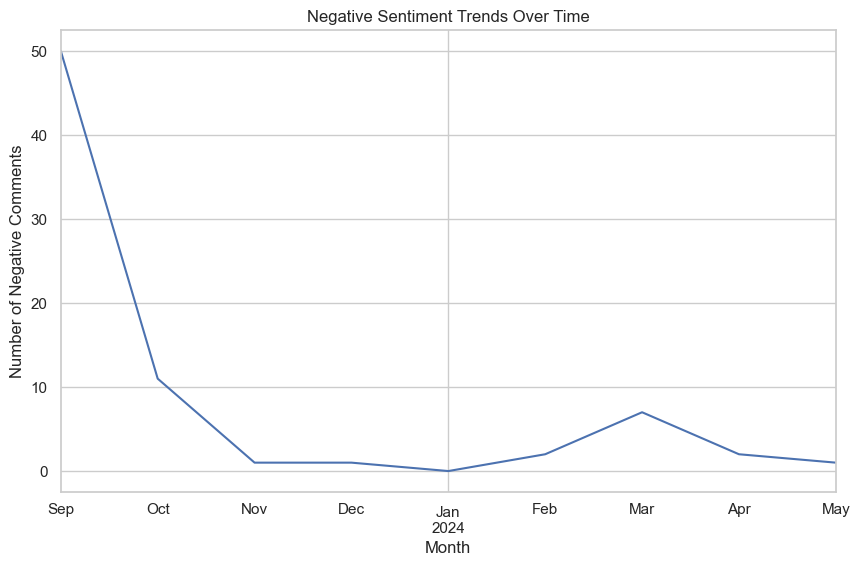

In [123]:
# Sentiment Trends Over Time
# Convert 'Date' column to datetime
negative_comments['Date'] = pd.to_datetime(negative_comments['Date'])

# Group by month and count negative comments
negative_trends = negative_comments.resample('M', on='Date').size()

# Plot trends
plt.figure(figsize=(10, 6))
negative_trends.plot(kind='line')
plt.title('Negative Sentiment Trends Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Negative Comments')
plt.grid(True)
plt.show()


#### Analyse Customer Journey 

In [104]:
# Preprocess the Date column
comments_600e['Date'] = pd.to_datetime(comments_600e['Date'])

# Ensure text data is clean
comments_600e['Text'] = comments_600e['Text'].astype(str)

In [114]:
# Define keywords for each stage
consideration_keywords = [
    'thinking about buying', 'considering', 'heard about', 'looking into', 'interested in', 
    'thinking of', 'exploring', 'exploring options', 'curious about', 'potential purchase', 
    'contemplating', 'researching', 'initial thoughts', 'first impression', 'early stages',
    'test drive', 'review', 'comparison', 'research', 'evaluating', 'checking out', 
    'comparing models', 'reading reviews', 'weighing options', 'pros and cons', 
    'in-depth analysis', 'performance review', 'customer feedback', 'expert opinion',
    'reviewing', 'considering purchase', 'considering buying', 'considering options',
    'considering alternatives', 'considering different models', 'considering different brands',
    'interest', 'interested', 'interested in buying', 'interested in purchasing',
]

purchase_keywords = [
    'just purchased', 'bought', 'ordered', 'got my', 'finally decided', 'finally bought', 
    'finally purchased', 'finally ordered', 'finally got', 'finally made the decision',
    'new car', 'went ahead', 'completed purchase', 'made the purchase', 'made the decision', 
    'made the order', 'made the buy', 'made the choice', 'made the commitment', 
    'loving my new car', 'enjoying', 'happy with', 'satisfied with', 'impressed with', 
    'excited about', 'thrilled with', 'delighted with', 'pleased with', 'content with',
    'recommend', 'would buy again', 'would purchase again', 'would recommend', 'owning',
    'i ordered', 'complete purchase', 'purchased completely', 'bought completely',
    'got my hands on', 'purchase online', 'purchased', 'bought', 'ordered', 'got my hands on',
]

disinterest_keywords = [
    'not interested', 'never buy', 'wouldn’t buy', 'don’t care', 'not for me', 
    'too expensive', 'overpriced', 'not worth it', 'disappointed', 'no way', 
    'waste of money', 'never', 'avoid', 'won’t consider', 'poor value', 'expensive',
    'do not want', 'not buying', 'never buy', 'not like', 'hate', 
    'would not consider', 'no interest', 'waste of money', 'uninterested', 'avoid', 'reject', 
    'decline', 'dislike', 'no thanks', 'not a fan', 'not worth', 'not worth it', 'overpriced', 
    'too expensive', 'would rather not', 'no need', 'would not buy', 'no plan to buy', 'no intention', 
    'skip', 'waste of time', 'not convinced', 'not worth the money', 'no value', 'no point', 'not interested in buying',
    'not worth the price', 'not for me', 'pass on this', 'not my style', 'not my thing', 'not my taste',
    'not my preference', 'disinterest', 'no desire', 'no intention', 'no plan', 'no intention to buy',
]


In [115]:
# Function to assign journey stage
def assign_journey_stage(text):
    text = text.lower()
    for keyword in consideration_keywords:
        if keyword in text:
            return 'consideration'
    for keyword in purchase_keywords:
        if keyword in text:
            return 'purchase'
    for keyword in disinterest_keywords:
        if keyword in text:
            return 'not interested'
    return None  # Assign None if no match

# Apply the function to assign journey stages
comments_600e['Journey_Stage'] = comments_600e['Text'].apply(assign_journey_stage)

# Remove rows where Journey_Stage is None (i.e., where it was 'other')
comments_600e = comments_600e.dropna(subset=['Journey_Stage'])


/var/folders/81/cc9538zd0r74dhd_qp99hlbw0000gn/T/ipykernel_48707/2775049931.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Journey_Stage', y='Sentiment', data=stage_sentiment_comments, palette='viridis')


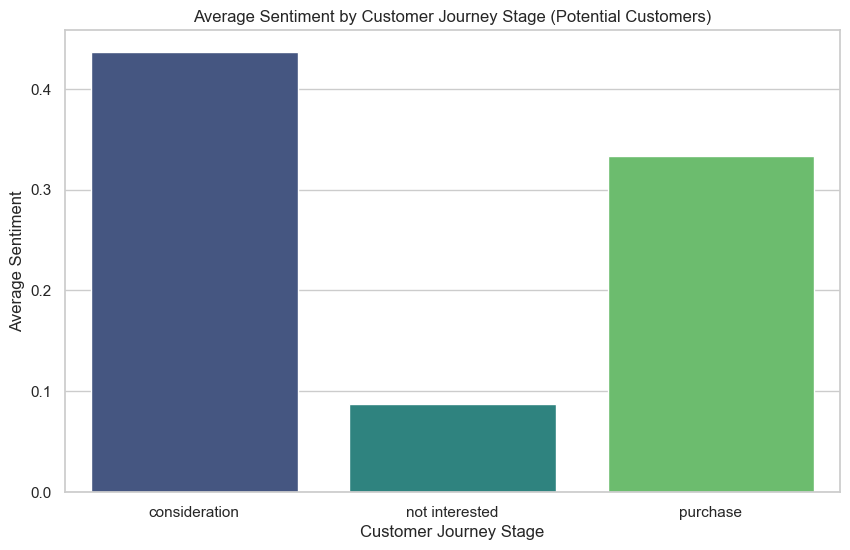

In [116]:
# Initialise the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Function to calculate sentiment
def get_sentiment(text):
    return sid.polarity_scores(text)['compound']

# Apply sentiment analysis
comments_600e['Sentiment'] = comments_600e['Text'].apply(get_sentiment)

# Group by Journey_Stage and calculate mean sentiment
stage_sentiment_comments = comments_600e.groupby('Journey_Stage')['Sentiment'].mean().reset_index()

# Plot the sentiment by journey stage for potential customers
plt.figure(figsize=(10, 6))
sns.barplot(x='Journey_Stage', y='Sentiment', data=stage_sentiment_comments, palette='viridis')
plt.title('Average Sentiment by Customer Journey Stage (Potential Customers)')
plt.xlabel('Customer Journey Stage')
plt.ylabel('Average Sentiment')
plt.show()


**Consideration Stage:**
* This stage shows the highest average sentiment, indicating that potential customers are generally positive when they are in the consideration phase. They are likely exploring the Fiat 600e and finding information that aligns with their expectations or interests.

**Purchase Stage:**
* The purchase stage has a moderately positive sentiment, suggesting that while customers are generally satisfied after purchasing the Fiat 600e, there may be some mixed feelings or concerns that could be addressed to enhance their post-purchase experience.

**Not Interested**
* This stage shows a significantly lower average sentiment. Customers in this category express dissatisfaction or disinterest, likely due to factors such as pricing, features, or other unmet expectations.

<Figure size 1400x800 with 0 Axes>

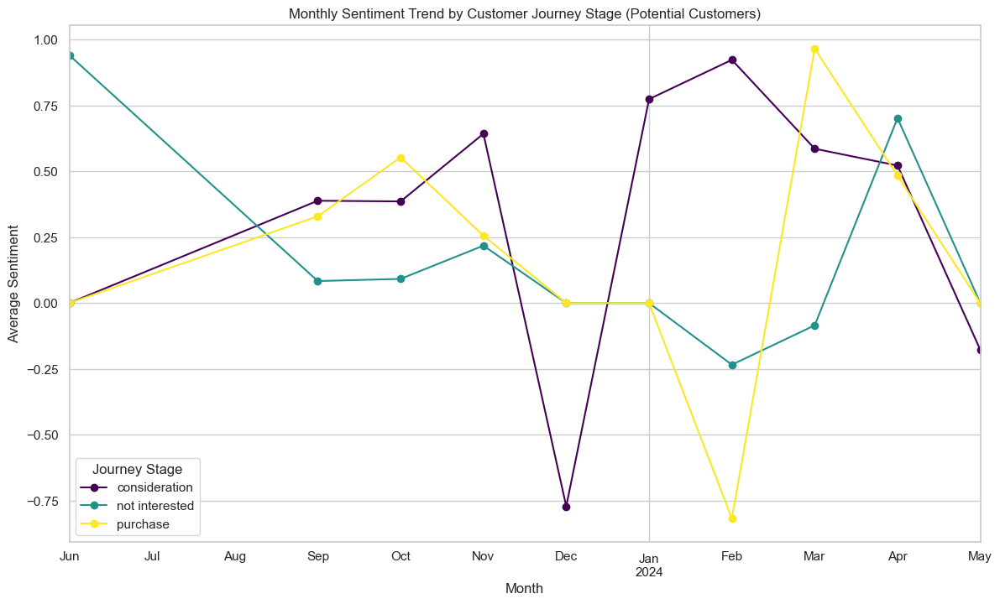

In [117]:
# Timeline analysis
# Extract month and year from the Date
comments_600e['Month'] = comments_600e['Date'].dt.to_period('M')

# Group by Month and Journey_Stage, and calculate mean sentiment
monthly_stage_sentiment = comments_600e.groupby(['Month', 'Journey_Stage'])['Sentiment'].mean().unstack().fillna(0)

# Plot the monthly sentiment trend by journey stage
plt.figure(figsize=(14, 8))
monthly_stage_sentiment.plot(kind='line', marker='o', colormap='viridis', figsize=(14, 8))
plt.title('Monthly Sentiment Trend by Customer Journey Stage (Potential Customers)')
plt.xlabel('Month')
plt.ylabel('Average Sentiment')
plt.legend(title='Journey Stage')
plt.grid(True)
plt.show()


**Consideration Stage:**
* The sentiment for the consideration stage fluctuates, with significant positive peaks around November 2023 and February 2024. These peaks may correlate with marketing efforts, positive reviews, or other influential factors that have drawn customer interest.
* A sharp decline in December 2023 suggests a possible market reaction to new information, perhaps related to the actual product release or other competitive factors.

**Purchase Stage:**
* The sentiment for the purchase stage also fluctuates, with a noticeable dip in February 2024. This could indicate post-purchase dissatisfaction or issues with the product after customers have had time to experience it.
* The sentiment recovers by April 2024, suggesting that either the issues were resolved or positive aspects of ownership were reinforced.

**Not Interested Stage**
* The sentiment in the "not interested" stage starts high but declines sharply around September 2023 and remains low through January 2024. This suggests that early enthusiasm may have been dampened by the actual product details or competition, leading to a more critical view of the Fiat 600e.
* A minor recovery in sentiment occurs in February and April 2024, possibly due to new marketing campaigns or changes in the product's market perception.

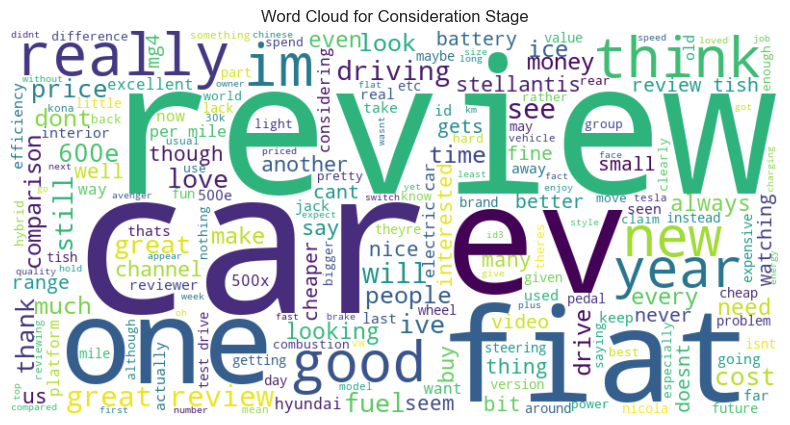

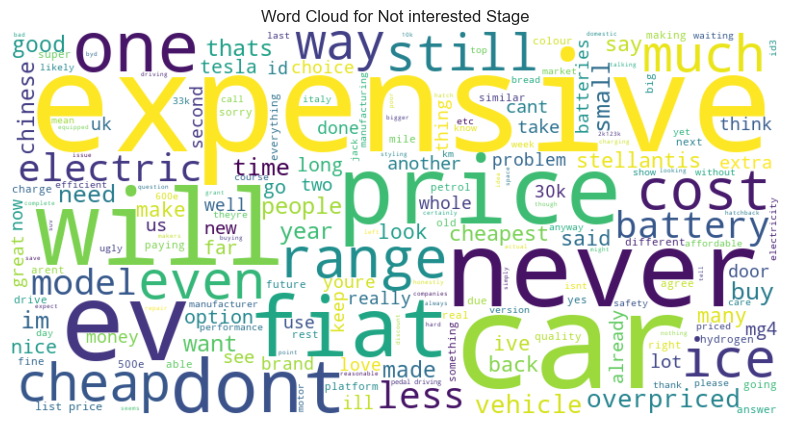

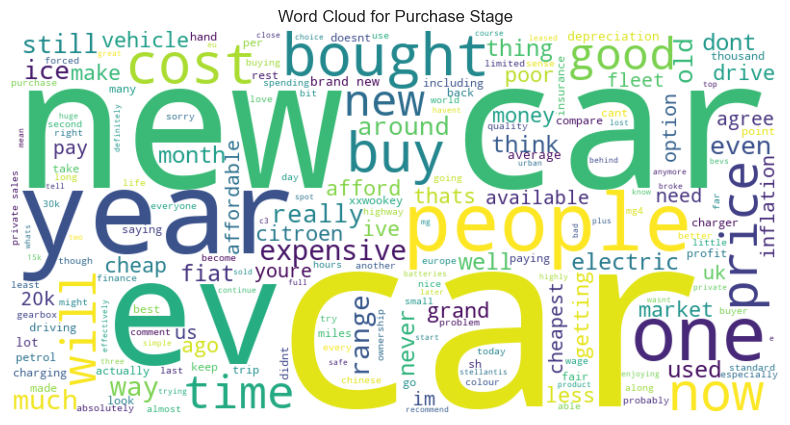

In [118]:
# Word cloud for each stage

# Function to generate word cloud
def generate_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Generate word clouds for each journey stage
for stage in comments_600e['Journey_Stage'].unique():
    stage_text = ' '.join(comments_600e[comments_600e['Journey_Stage'] == stage]['Text'])
    generate_wordcloud(stage_text, f'Word Cloud for {stage.capitalize()} Stage')

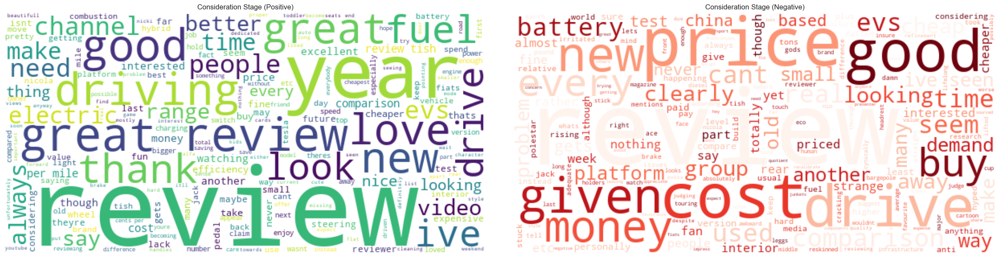

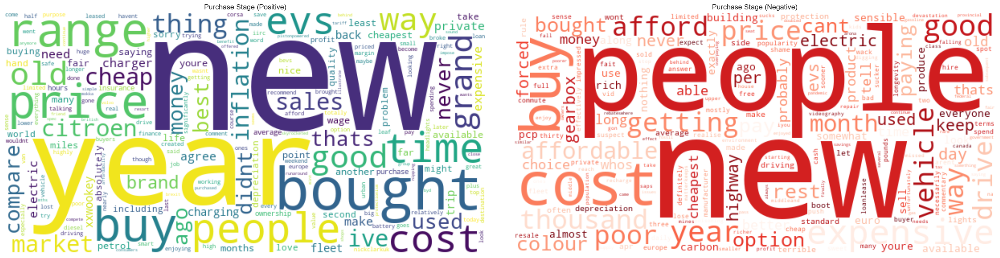

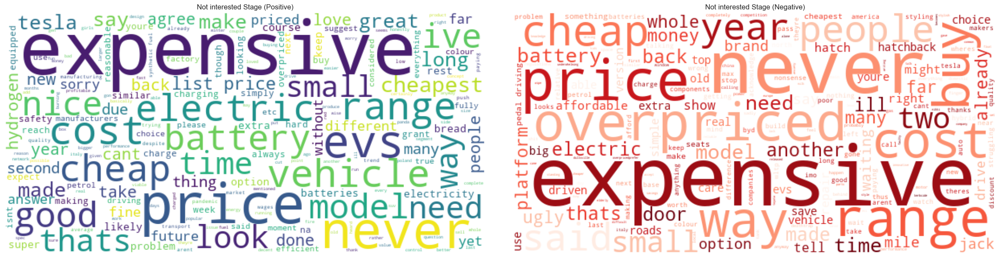

In [119]:
# Function to generate and display word clouds per journey stage and sentiment
def generate_word_clouds_by_sentiment(data, stage):
    # Filter positive and negative data
    positive_data = data[(data['Journey_Stage'] == stage) & (data['Sentiment'] > 0)]
    negative_data = data[(data['Journey_Stage'] == stage) & (data['Sentiment'] <= 0)]
    
    # Generate word clouds with rectangular dimensions
    positive_text = ' '.join(positive_data['Processed_Text'])
    negative_text = ' '.join(negative_data['Processed_Text'])
    
    positive_wordcloud = WordCloud(width=600, height=300, background_color='white').generate(positive_text)
    negative_wordcloud = WordCloud(width=600, height=300, background_color='white', colormap='Reds').generate(negative_text)
    
    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(24, 6)) 
    
    axes[0].imshow(positive_wordcloud, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'{stage.capitalize()} Stage (Positive)')
    
    axes[1].imshow(negative_wordcloud, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'{stage.capitalize()} Stage (Negative)')
    
    plt.tight_layout()
    plt.show()

# Generate word clouds for each journey stage
for stage in ['consideration', 'purchase', 'not interested']:
    generate_word_clouds_by_sentiment(comments_600e, stage)


**Consideration Stage**
* In the Consideration Stage, potential customers show a mix of positive and negative sentiments. 
* Positive discussions often focus on the driving experience and the overall quality of reviews, indicating a strong interest in these aspects of the Fiat 600e. 
* However, there are significant concerns regarding the price and value proposition, with many users comparing the 600e unfavorably to other vehicles in its class.

**Not Interested Stage**
* During the Not Interested Stage, sentiment is generally more negative. 
* While there is some interest in the broader electric vehicle market and cost-efficiency, many potential customers express dissatisfaction with the high prices and the perceived lack of value. 
* The conversations often highlight skepticism about the Fiat 600e's long-term worth, with comparisons to other, more affordable options.

**Purchase Stage**
* In the Purchase Stage, customers who have bought the Fiat 600e generally express positive sentiments, particularly appreciating its range and affordability. 
* These users often justify their purchase decision by emphasising the vehicle's value for money. 
* However, some customers express regret, particularly concerning unexpected costs and depreciation, leading to a more mixed sentiment overall.


#### Emotion Analysis for Opinion Leaders and Potential Customers 

In [124]:
# Initialise VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Analyse emotions
def get_emotion(text):
    scores = sia.polarity_scores(text)
    if scores['compound'] > 0.05:
        return 'positive'
    elif scores['compound'] < -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply to both datasets
comments_600e['Emotion'] = comments_600e['Text'].apply(get_emotion)
opinionLeaders600['Emotion'] = opinionLeaders600['Text'].apply(get_emotion)

# Compare emotions
print("Potential Customers Emotion Distribution:")
print(comments_600e['Emotion'].value_counts())

print("Opinion Leaders Emotion Distribution:")
print(opinionLeaders600['Emotion'].value_counts())


Potential Customers Emotion Distribution:
Emotion
positive    189
negative     75
neutral      45
Name: count, dtype: int64
Opinion Leaders Emotion Distribution:
Emotion
positive    91
negative     7
neutral      1
Name: count, dtype: int64
